# Notebook "4_Besoin_2_Classifieur_EPA_bdf"


## Description

Ce notebook se focalise sur l'implantation de différents classifieurs sur les données EPA "Bruit de fond". Les variables cibles sont les saisons et les types de sol.

## Structure du notebook

Ce notebook est construit de plusieurs parties :
- I. Import des bibliothèques
- II. Préprocessing des données
- III. Classification des saisons
- IV. Classification des types de sol
- V. Classification 2 à 2 

## Prérequis

### Source de données

Pour que le notebook fonctionne, la base de données EPA "Bruit de fond" normalisées doit être disponible dans le même fichier que le notebook. Par ailleurs, cette source doit être au format csv avec le nom "DB_EPA_BDF_normalized.csv"

### Installation des prérequis techniques

Le notebook fonctionne sur Python 3.7 avec les bibliothèques suivantes :
- pandas
- seaborn
- matplotlib
- numpy
- scipy
- sklearn
- imblearn

# I. Import libraries

In [1]:
import warnings
warnings.filterwarnings('ignore')
import pandas.io.sql as sqlio

# data analysis and wrangling
import pandas as pd
import numpy as np
import random as rnd

# visualization
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

# machine learning
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC, LinearSVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import Perceptron
from sklearn.linear_model import SGDClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report

# II. Preprocessing data

## II.a Load data

In [2]:
df_epa_emission = pd.read_csv('DB_EPA_Emission_normalized.csv', sep=';')
data = pd.read_csv('DB_EPA_BDF_normalized.csv', sep=';')
df_merge = pd.read_csv('DB_EPA_merge_normalized.csv', sep=';')

## II.b Description des données

In [3]:
print(f"This data contains : {len(data)}")
print("In each column the number of none values :")
print(data.isnull().sum())

This data contains : 684
In each column the number of none values :
Site                0
Type                0
Season              0
Site #              0
Moment              0
2378-TCDD_A         0
12378-PeCDD_A       0
123478-HxCDD_A      0
123678-HxCDD_A      0
123789-HxCDD_A      0
1234678-HpCDD_A     0
OCDD_A              0
2378-TCDF_A         0
12378-PeCDF_A       0
23478-PeCDF_A       0
123478-HxCDF_A      0
123678-HxCDF_A      0
234678-HxCDF_A      0
123789-HxCDF_A      0
1234678-HpCDF_A     0
1234789-HpCDF_A     0
OCDF_A              0
2378-TCDD_C        56
12378-PeCDD_C      56
123478-HxCDD_C     56
123678-HxCDD_C     56
123789-HxCDD_C     56
1234678-HpCDD_C    56
OCDD_C             56
2378-TCDF_C        56
12378-PeCDF_C      56
23478-PeCDF_C      56
123478-HxCDF_C     56
123678-HxCDF_C     56
234678-HxCDF_C     56
123789-HxCDF_C     56
1234678-HpCDF_C    56
1234789-HpCDF_C    56
OCDF_C             56
dtype: int64


In [4]:
data.describe()

,Site #,Moment,2378-TCDD_A,12378-PeCDD_A,123478-HxCDD_A,123678-HxCDD_A,123789-HxCDD_A,1234678-HpCDD_A,OCDD_A,2378-TCDF_A,...,2378-TCDF_C,12378-PeCDF_C,23478-PeCDF_C,123478-HxCDF_C,123678-HxCDF_C,234678-HxCDF_C,123789-HxCDF_C,1234678-HpCDF_C,1234789-HpCDF_C,OCDF_C
count,684.000000,684.000000,684.000000,684.000000,684.000000,684.000000,684.000000,684.000000,684.000000,684.000000,...,628.000000,628.000000,628.000000,628.000000,628.000000,628.000000,628.000000,628.000000,628.000000,628.000000
mean,16.507310,18.059942,0.001457,0.006649,0.007309,0.013318,0.012759,0.176100,0.636301,0.005647,...,0.027180,0.042278,0.071425,0.080421,0.073819,0.098387,0.011948,0.588241,0.065703,0.083119
std,9.612474,7.111797,0.002161,0.007862,0.004213,0.006795,0.009170,0.041133,0.091836,0.007111,...,0.009972,0.018650,0.031547,0.024234,0.018715,0.035431,0.012872,0.088643,0.025024,0.044912
min,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.006543,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.031108,0.000000,0.000000
25%,8.000000,13.000000,0.000547,0.003695,0.005388,0.009894,0.009608,0.152310,0.600099,0.002262,...,0.021971,0.032838,0.052991,0.065597,0.060840,0.074436,0.002622,0.538713,0.054361,0.057441
50%,16.000000,19.000000,0.000846,0.005109,0.006775,0.012609,0.012156,0.176127,0.655883,0.003930,...,0.026102,0.041923,0.070855,0.083044,0.076563,0.102249,0.007986,0.584837,0.069001,0.077606
75%,25.000000,24.000000,0.001432,0.006700,0.008282,0.015126,0.014592,0.199483,0.688999,0.006645,...,0.031186,0.049388,0.084283,0.096114,0.086030,0.120044,0.015889,0.636164,0.079698,0.098146
max,35.000000,29.000000,0.019895,0.084595,0.035076,0.066760,0.197259,0.645560,0.950345,0.078577,...,0.087089,0.220647,0.264289,0.174769,0.146091,0.390897,0.092300,0.962749,0.175745,0.459146


# III. Classification par saison

## III.a Répartition des saisons

In [5]:
data_season = data.drop(data[data['Season']=='Spring/Sum'].index)
data_season = data_season.drop(data_season[data_season['Season']=='Winter (late)'].index)

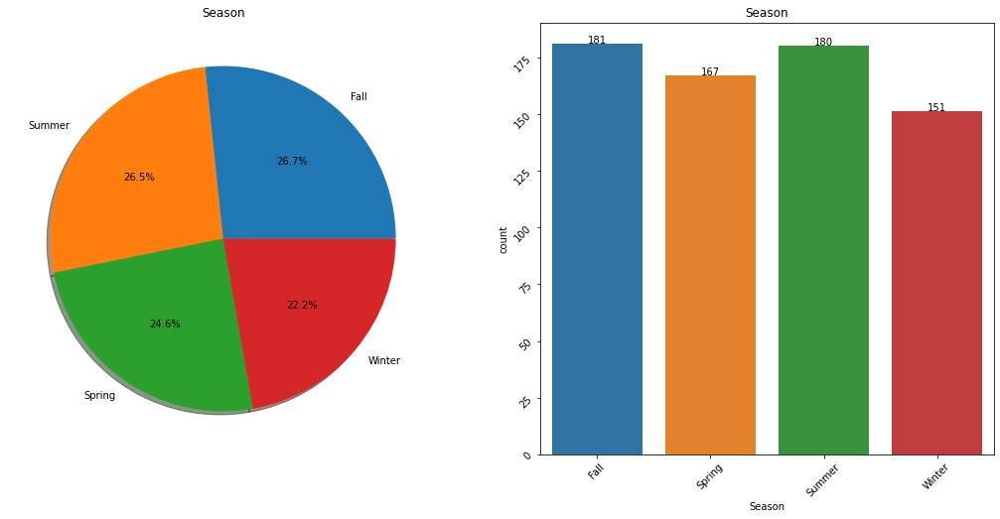

In [6]:
col = 'Season'
f,ax=plt.subplots(1,2,figsize=(18,8))
data_season[col].value_counts().plot.pie(autopct='%1.1f%%',ax=ax[0],shadow=True)
ax[0].set_title(col)
ax[0].set_ylabel('')
graph1=sns.countplot(col,data=data_season,ax=ax[1])
ax[1].set_title(col)
ax[1].tick_params(labelrotation=45)
for p in graph1.patches:
    height = p.get_height()
    graph1.text(p.get_x()+p.get_width()/2., height + 0.1, height,ha="center")
plt.show()

In [7]:
data_season['label'] = data_season['Season'].map({'Summer': 0, 'Fall': 1, 'Winter': 2, 'Spring': 3})

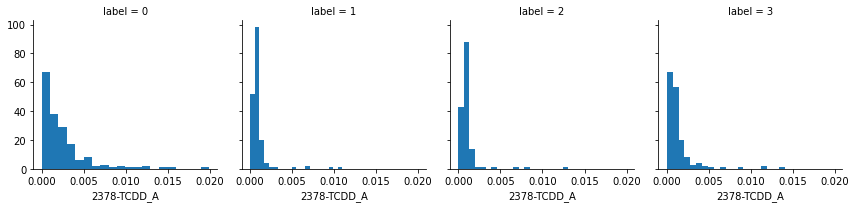

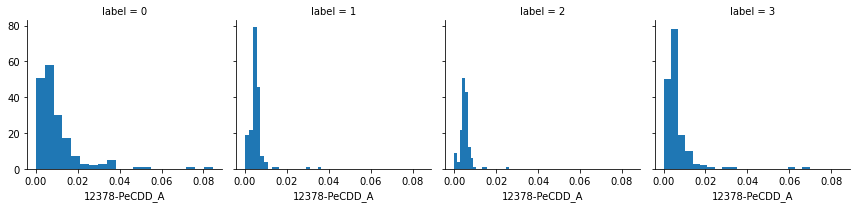

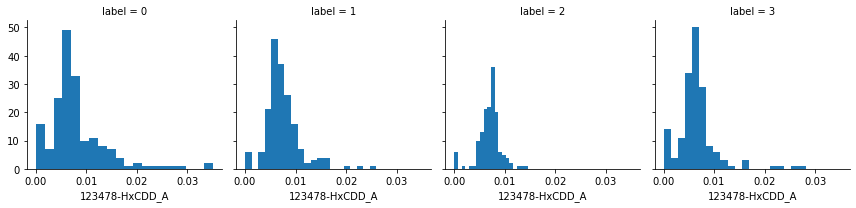

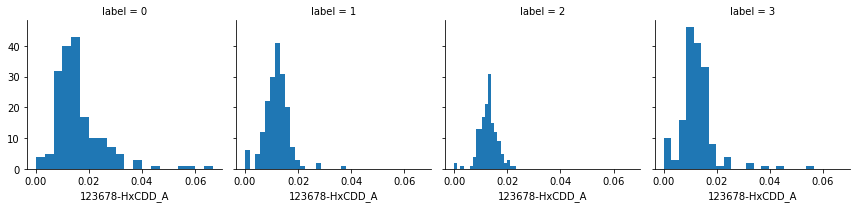

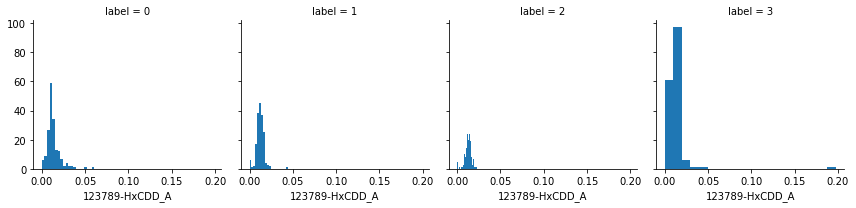

...

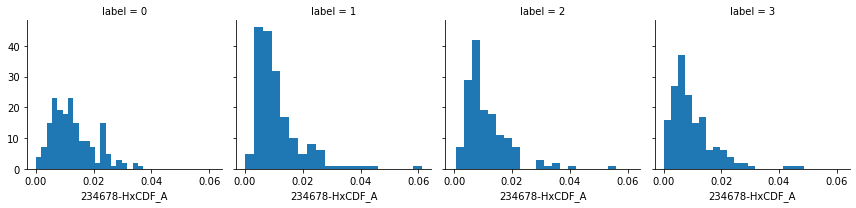

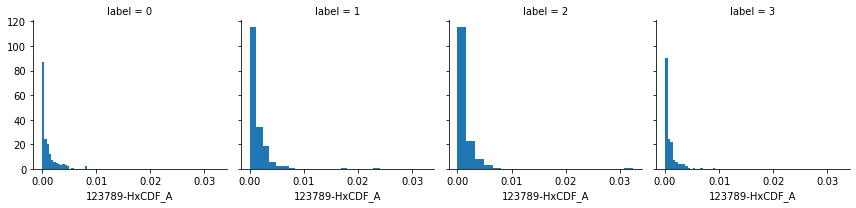

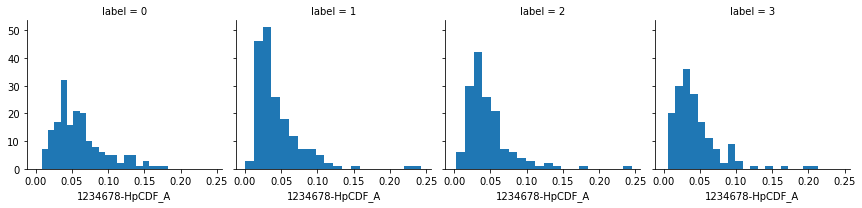

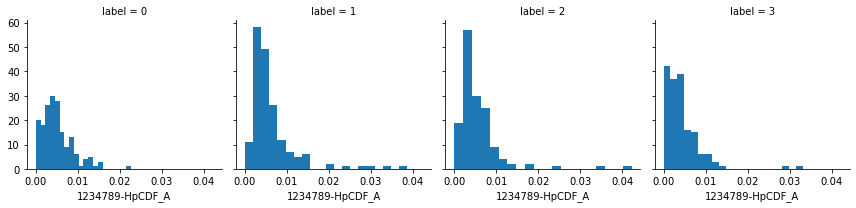

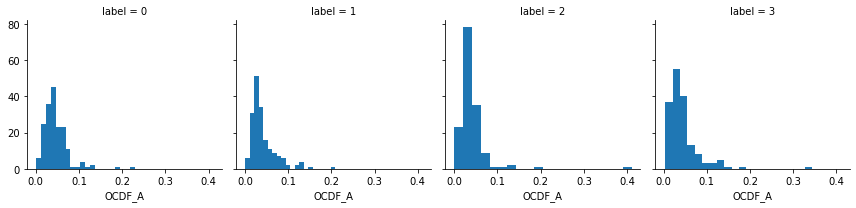

In [8]:
congenere = ['2378-TCDD_A', '12378-PeCDD_A', '123478-HxCDD_A', '123678-HxCDD_A',
       '123789-HxCDD_A', '1234678-HpCDD_A', 'OCDD_A', '2378-TCDF_A',
       '12378-PeCDF_A', '23478-PeCDF_A', '123478-HxCDF_A', '123678-HxCDF_A',
       '234678-HxCDF_A', '123789-HxCDF_A', '1234678-HpCDF_A',
       '1234789-HpCDF_A', 'OCDF_A']

for i in congenere:
    g = sns.FacetGrid(data_season, col='label')
    g.map(plt.hist, i, bins=20)

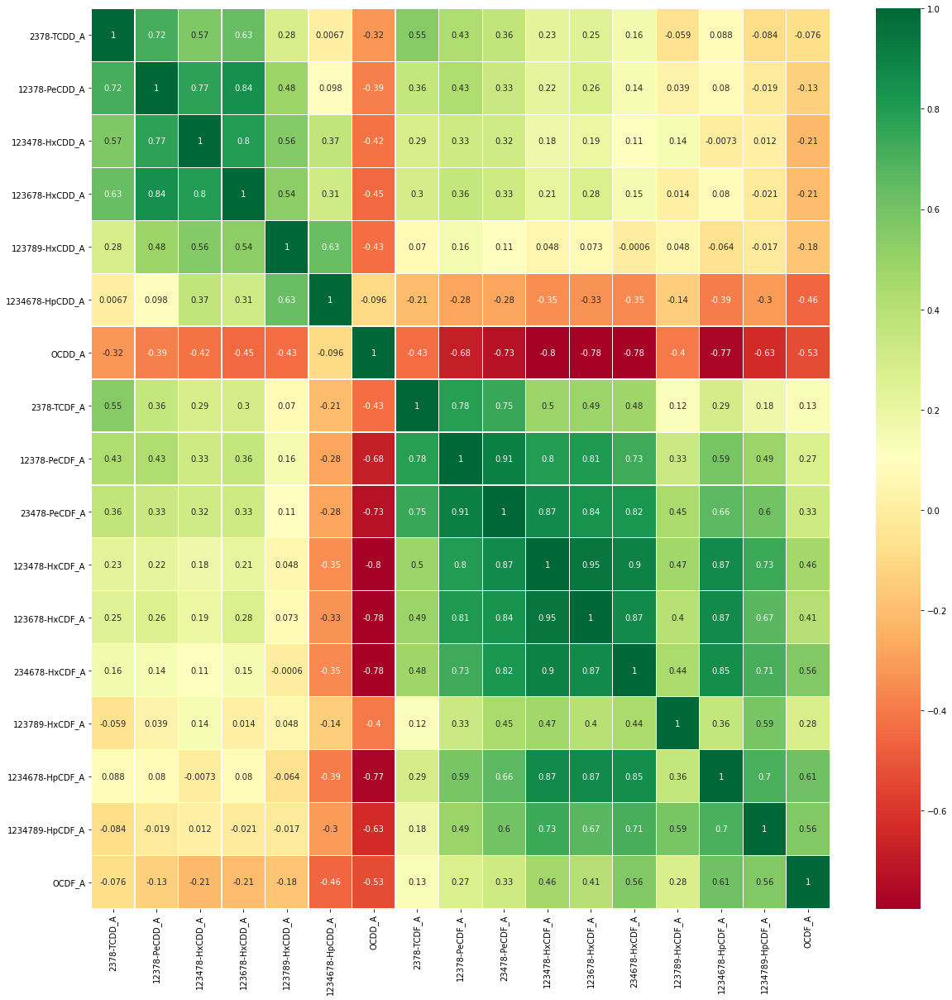

In [9]:
data_season[congenere] = data_season[congenere].astype(float)
sns.heatmap(data_season[congenere].corr(),annot=True,cmap='RdYlGn',linewidths=0.2) #data.corr()-->correlation matrix
fig=plt.gcf()
fig.set_size_inches(20,20)
plt.show()

## III.b Utilisation de classifieurs par saison

In [10]:
#importing all the required ML packages
from sklearn.linear_model import LogisticRegression #logistic regression
from sklearn import svm #support vector Machine
from sklearn.ensemble import RandomForestClassifier #Random Forest
from sklearn.neighbors import KNeighborsClassifier #KNN
from sklearn.naive_bayes import GaussianNB #Naive bayes
from sklearn.tree import DecisionTreeClassifier #Decision Tree
from sklearn.model_selection import train_test_split #training and testing data split
from sklearn import metrics #accuracy measure
from sklearn.metrics import confusion_matrix #for confusion matrix
from sklearn.model_selection import KFold #for K-fold cross validation
from sklearn.model_selection import cross_val_score #score evaluation
from sklearn.model_selection import cross_val_predict #prediction

### 1- Normalisation A

In [11]:
train,test=train_test_split(data_season,test_size=0.3,random_state=0,stratify=data_season['label'])
train_X=train[train.columns[5:22]]
train_Y=train[train.columns[-1:]]
test_X=test[test.columns[5:22]]
test_Y=test[test.columns[-1:]]
X=data_season[data_season.columns[5:22]]
Y=data_season['label']

{'Summer': 0, 'Fall': 1, 'Winter': 2, 'Spring': 3}


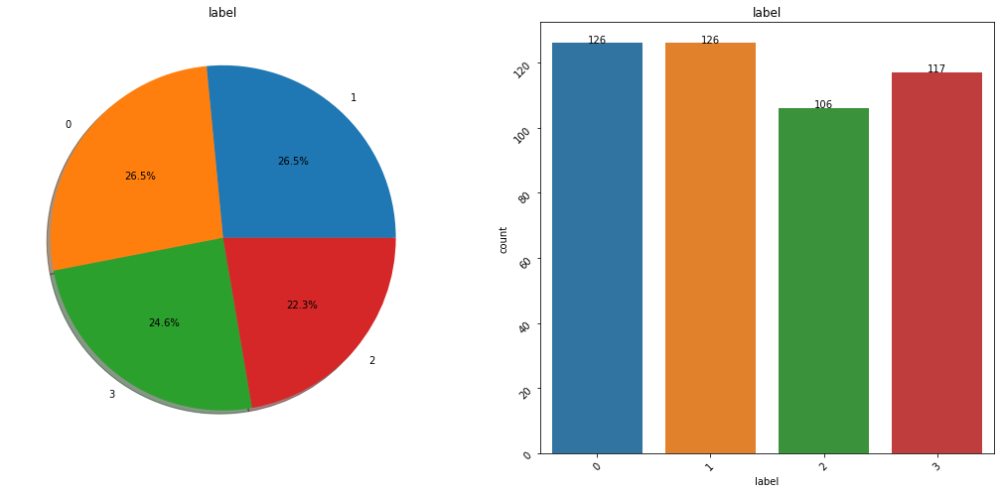

In [12]:
print({'Summer': 0, 'Fall': 1, 'Winter': 2, 'Spring': 3})
col = 'label'
f,ax=plt.subplots(1,2,figsize=(18,8))
train_Y[col].value_counts().plot.pie(autopct='%1.1f%%',ax=ax[0],shadow=True)
ax[0].set_title(col)
ax[0].set_ylabel('')
graph1=sns.countplot(col,data=train_Y,ax=ax[1])
ax[1].set_title(col)
ax[1].tick_params(labelrotation=45)
for p in graph1.patches:
    height = p.get_height()
    graph1.text(p.get_x()+p.get_width()/2., height + 0.1, height,ha="center")
plt.show()

In [13]:
model = LogisticRegression()
model.fit(train_X,train_Y)
prediction3=model.predict(test_X)
print('The accuracy of the Logistic Regression is',metrics.accuracy_score(prediction3,test_Y))

The accuracy of the Logistic Regression is 0.31862745098039214


In [14]:
model=DecisionTreeClassifier(max_leaf_nodes=6)
model.fit(train_X,train_Y)
prediction4=model.predict(test_X)
print('The accuracy of the Decision Tree is',metrics.accuracy_score(prediction4,test_Y))

The accuracy of the Decision Tree is 0.43137254901960786


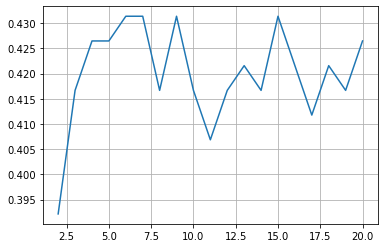

In [15]:
acc=[]
for i in range(2,21):
    model=DecisionTreeClassifier(max_leaf_nodes=i)
    model.fit(train_X,train_Y)
    prediction4=model.predict(test_X)
    acc.append(metrics.accuracy_score(prediction4,test_Y))
plt.plot(range(2,21), acc)
plt.grid()

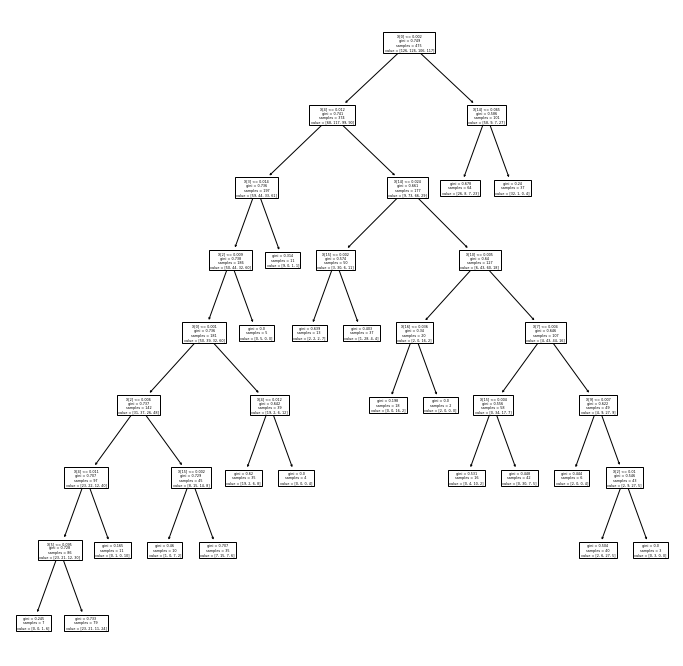

In [16]:
from sklearn import tree
fig, ax = plt.subplots(figsize=(12, 12))
_=tree.plot_tree(model)

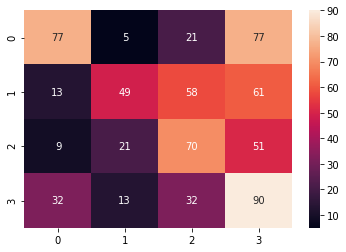

In [17]:
y_pred = cross_val_predict(DecisionTreeClassifier(max_leaf_nodes=6),X,Y,cv=10)
_=sns.heatmap(confusion_matrix(Y,y_pred),annot=True,fmt='2.0f')

In [18]:
kfold = KFold(n_splits=5, random_state=0) # k=10, split the data into 10 equal parts
xyz=[]
accuracy=[]
std=[]
classifiers=['Linear Svm','Radial Svm','Logistic Regression','KNN','Decision Tree','Naive Bayes','Random Forest']
models=[svm.SVC(kernel='linear'),svm.SVC(kernel='rbf'),LogisticRegression(),KNeighborsClassifier(n_neighbors=9),DecisionTreeClassifier(),GaussianNB(),RandomForestClassifier(n_estimators=100)]
for i in models:
    model = i
    cv_result = cross_val_score(model,X,Y, cv = kfold, scoring = "accuracy")
    cv_result=cv_result
    xyz.append(cv_result.mean())
    std.append(cv_result.std())
    accuracy.append(cv_result)
new_models_dataframe2=pd.DataFrame({'CV Mean':xyz,'Std':std},index=classifiers)       
new_models_dataframe2

,CV Mean,Std
Linear Svm,0.281449,0.053787
Radial Svm,0.350577,0.058783
Logistic Regression,0.355022,0.064220
KNN,0.366743,0.028021
Decision Tree,0.354924,0.027129
Naive Bayes,0.340338,0.055716
Random Forest,0.438878,0.017032


In [19]:
seasons = {'Sum': 0, 'Fall': 1, 'Win': 2, 'Spr': 3}
[{seasons[season] : season} for season in seasons.keys()]

[{0: 'Sum'}, {1: 'Fall'}, {2: 'Win'}, {3: 'Spr'}]

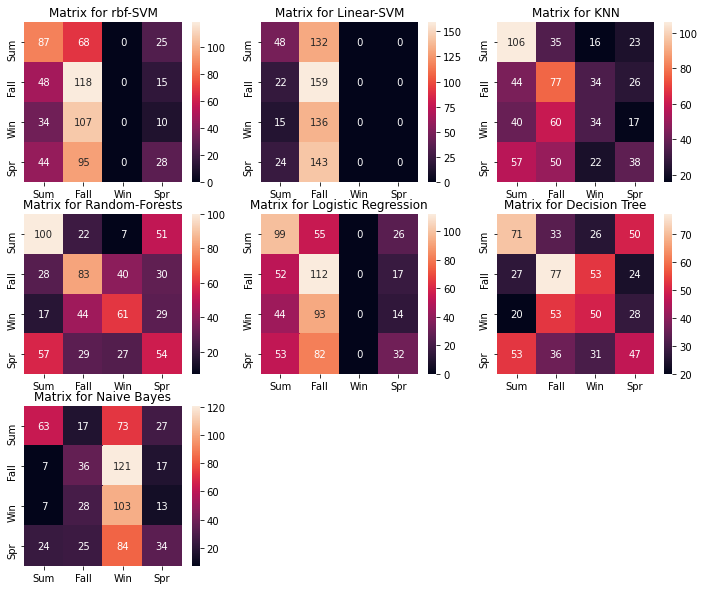

In [20]:

f,ax=plt.subplots(3,3,figsize=(12,10))
y_pred = cross_val_predict(svm.SVC(kernel='rbf'),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[0,0],annot=True,fmt='2.0f')
ax[0,0].set_title('Matrix for rbf-SVM')
ax[0,0].xaxis.set_ticklabels([season for season in seasons.keys()])
ax[0,0].yaxis.set_ticklabels([season for season in seasons.keys()])

y_pred = cross_val_predict(svm.SVC(kernel='linear'),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[0,1],annot=True,fmt='2.0f')
ax[0,1].set_title('Matrix for Linear-SVM')
ax[0,1].xaxis.set_ticklabels([season for season in seasons.keys()])
ax[0,1].yaxis.set_ticklabels([season for season in seasons.keys()])

y_pred = cross_val_predict(KNeighborsClassifier(n_neighbors=9),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[0,2],annot=True,fmt='2.0f')
ax[0,2].set_title('Matrix for KNN')
ax[0,2].xaxis.set_ticklabels([season for season in seasons.keys()])
ax[0,2].yaxis.set_ticklabels([season for season in seasons.keys()])

y_pred = cross_val_predict(RandomForestClassifier(n_estimators=100),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[1,0],annot=True,fmt='2.0f')
ax[1,0].set_title('Matrix for Random-Forests')
ax[1,0].xaxis.set_ticklabels([season for season in seasons.keys()])
ax[1,0].yaxis.set_ticklabels([season for season in seasons.keys()])

y_pred = cross_val_predict(LogisticRegression(),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[1,1],annot=True,fmt='2.0f')
ax[1,1].set_title('Matrix for Logistic Regression')
ax[1,1].xaxis.set_ticklabels([season for season in seasons.keys()])
ax[1,1].yaxis.set_ticklabels([season for season in seasons.keys()])

y_pred = cross_val_predict(DecisionTreeClassifier(),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[1,2],annot=True,fmt='2.0f')
ax[1,2].set_title('Matrix for Decision Tree')
ax[1,2].xaxis.set_ticklabels([season for season in seasons.keys()])
ax[1,2].yaxis.set_ticklabels([season for season in seasons.keys()])

y_pred = cross_val_predict(GaussianNB(),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[2,0],annot=True,fmt='2.0f')
ax[2,0].set_title('Matrix for Naive Bayes')
ax[2,0].xaxis.set_ticklabels([season for season in seasons.keys()])
ax[2,0].yaxis.set_ticklabels([season for season in seasons.keys()])

plt.subplots_adjust(hspace=0.2,wspace=0.2)
f.delaxes(ax[2,1])
f.delaxes(ax[2,2])
plt.show()

### 2- Normalisation C:

In [21]:
data_season_C = data_season[data_season.columns[22:40]].copy()
data_season_C.dropna(inplace=True)
data_season_C.reset_index(drop=True, inplace=True)

In [22]:
train,test=train_test_split(data_season_C,test_size=0.3,random_state=0,stratify=data_season_C['label'])
train_X=train[train.columns[:17]]
train_Y=train[train.columns[-1:]]
test_X=test[test.columns[:17]]
test_Y=test[test.columns[-1:]]
X=data_season_C[data_season_C.columns[:17]]
Y=data_season_C['label']

{'Summer': 0, 'Fall': 1, 'Winter': 2, 'Spring': 3}


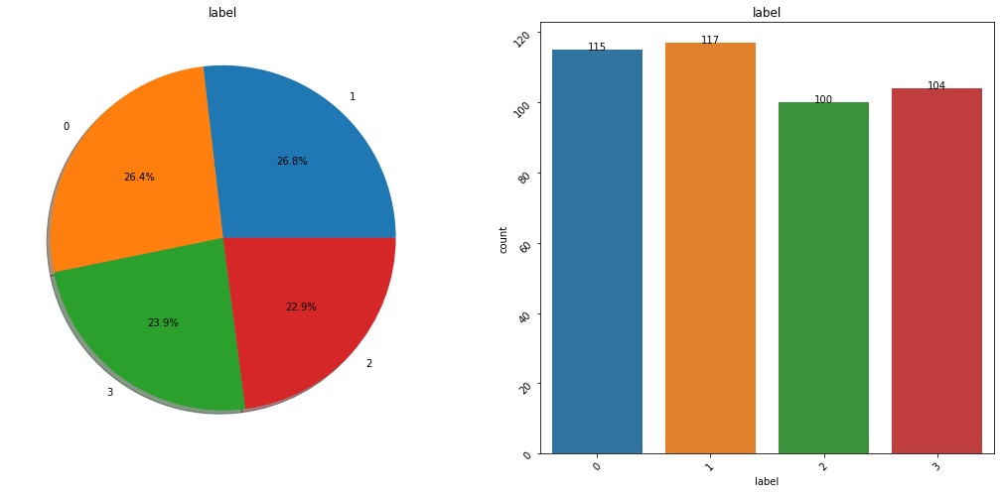

In [23]:
print({'Summer': 0, 'Fall': 1, 'Winter': 2, 'Spring': 3})
col = 'label'
f,ax=plt.subplots(1,2,figsize=(18,8))
train_Y[col].value_counts().plot.pie(autopct='%1.1f%%',ax=ax[0],shadow=True)
ax[0].set_title(col)
ax[0].set_ylabel('')
graph1=sns.countplot(col,data=train_Y,ax=ax[1])
ax[1].set_title(col)
ax[1].tick_params(labelrotation=45)
for p in graph1.patches:
    height = p.get_height()
    graph1.text(p.get_x()+p.get_width()/2., height + 0.1, height,ha="center")
plt.show()

In [24]:
model = LogisticRegression()
model.fit(train_X,train_Y)
prediction3=model.predict(test_X)
print('The accuracy of the Logistic Regression is',metrics.accuracy_score(prediction3,test_Y))

The accuracy of the Logistic Regression is 0.44919786096256686


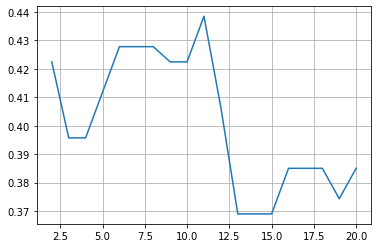

In [25]:
acc=[]
for i in range(2,21):
    model=DecisionTreeClassifier(max_leaf_nodes=i)
    model.fit(train_X,train_Y)
    prediction4=model.predict(test_X)
    acc.append(metrics.accuracy_score(prediction4,test_Y))
plt.plot(range(2,21), acc)
plt.grid()

In [26]:
model=DecisionTreeClassifier(max_leaf_nodes=6)
model.fit(train_X,train_Y)
prediction4=model.predict(test_X)
print('The accuracy of the Decision Tree is',metrics.accuracy_score(prediction4,test_Y))

The accuracy of the Decision Tree is 0.42780748663101603


In [27]:
for i,j in enumerate(train_X.columns):
    print(i, j)

0 2378-TCDD_C
1 12378-PeCDD_C
2 123478-HxCDD_C
3 123678-HxCDD_C
4 123789-HxCDD_C
5 1234678-HpCDD_C
6 OCDD_C
7 2378-TCDF_C
8 12378-PeCDF_C
9 23478-PeCDF_C
10 123478-HxCDF_C
11 123678-HxCDF_C
12 234678-HxCDF_C
13 123789-HxCDF_C
14 1234678-HpCDF_C
15 1234789-HpCDF_C
16 OCDF_C


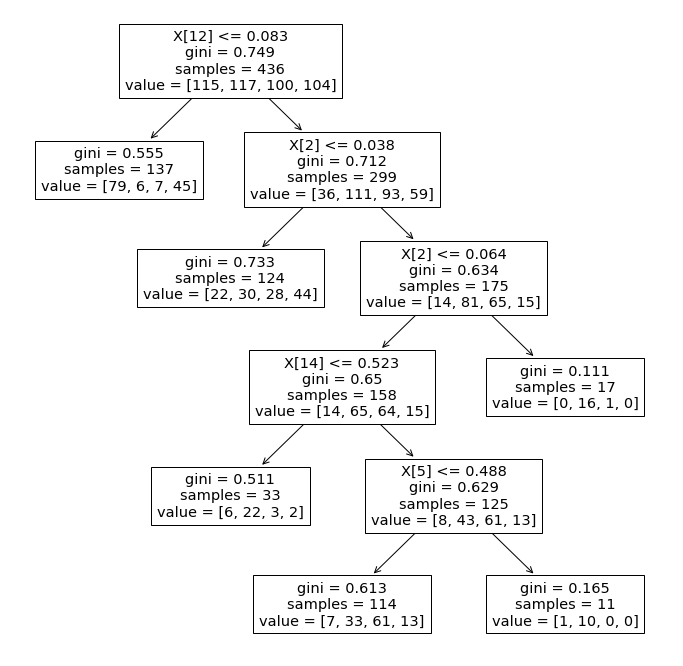

In [28]:
from sklearn import tree
fig, ax = plt.subplots(figsize=(12, 12))
_=tree.plot_tree(model)

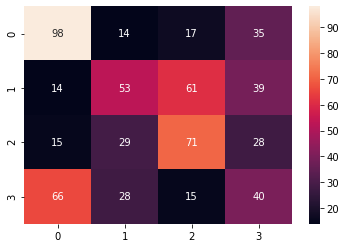

In [29]:
y_pred = cross_val_predict(DecisionTreeClassifier(max_leaf_nodes=6),X,Y,cv=10)
_=sns.heatmap(confusion_matrix(Y,y_pred),annot=True,fmt='2.0f')

In [30]:
kfold = KFold(n_splits=5, random_state=0) # k=10, split the data into 10 equal parts
xyz=[]
accuracy=[]
std=[]
classifiers=['Linear Svm','Radial Svm','Logistic Regression','KNN','Decision Tree','Naive Bayes','Random Forest']
models=[svm.SVC(kernel='linear'),svm.SVC(kernel='rbf'),LogisticRegression(),KNeighborsClassifier(n_neighbors=9),DecisionTreeClassifier(max_leaf_nodes=6),GaussianNB(),RandomForestClassifier(n_estimators=100)]
for i in models:
    model = i
    cv_result = cross_val_score(model,X,Y, cv = kfold, scoring = "accuracy")
    cv_result=cv_result
    xyz.append(cv_result.mean())
    std.append(cv_result.std())
    accuracy.append(cv_result)
new_models_dataframe2=pd.DataFrame({'CV Mean':xyz,'Std':std},index=classifiers)       
new_models_dataframe2

,CV Mean,Std
Linear Svm,0.391639,0.049550
Radial Svm,0.417290,0.030623
Logistic Regression,0.430129,0.029487
KNN,0.410929,0.043453
Decision Tree,0.409303,0.024156
Naive Bayes,0.417394,0.028622
Random Forest,0.531419,0.063716


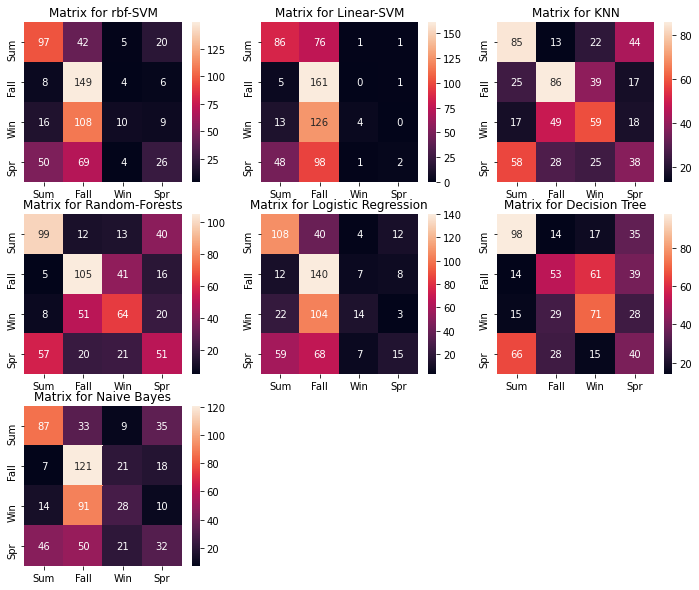

In [31]:
f,ax=plt.subplots(3,3,figsize=(12,10))
y_pred = cross_val_predict(svm.SVC(kernel='rbf'),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[0,0],annot=True,fmt='2.0f')
ax[0,0].set_title('Matrix for rbf-SVM')
ax[0,0].xaxis.set_ticklabels([season for season in seasons.keys()])
ax[0,0].yaxis.set_ticklabels([season for season in seasons.keys()])

y_pred = cross_val_predict(svm.SVC(kernel='linear'),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[0,1],annot=True,fmt='2.0f')
ax[0,1].set_title('Matrix for Linear-SVM')
ax[0,1].xaxis.set_ticklabels([season for season in seasons.keys()])
ax[0,1].yaxis.set_ticklabels([season for season in seasons.keys()])

y_pred = cross_val_predict(KNeighborsClassifier(n_neighbors=9),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[0,2],annot=True,fmt='2.0f')
ax[0,2].set_title('Matrix for KNN')
ax[0,2].xaxis.set_ticklabels([season for season in seasons.keys()])
ax[0,2].yaxis.set_ticklabels([season for season in seasons.keys()])

y_pred = cross_val_predict(RandomForestClassifier(n_estimators=100),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[1,0],annot=True,fmt='2.0f')
ax[1,0].set_title('Matrix for Random-Forests')
ax[1,0].xaxis.set_ticklabels([season for season in seasons.keys()])
ax[1,0].yaxis.set_ticklabels([season for season in seasons.keys()])

y_pred = cross_val_predict(LogisticRegression(),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[1,1],annot=True,fmt='2.0f')
ax[1,1].set_title('Matrix for Logistic Regression')
ax[1,1].xaxis.set_ticklabels([season for season in seasons.keys()])
ax[1,1].yaxis.set_ticklabels([season for season in seasons.keys()])

y_pred = cross_val_predict(DecisionTreeClassifier(max_leaf_nodes=6),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[1,2],annot=True,fmt='2.0f')
ax[1,2].set_title('Matrix for Decision Tree')
ax[1,2].xaxis.set_ticklabels([season for season in seasons.keys()])
ax[1,2].yaxis.set_ticklabels([season for season in seasons.keys()])

y_pred = cross_val_predict(GaussianNB(),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[2,0],annot=True,fmt='2.0f')
ax[2,0].set_title('Matrix for Naive Bayes')
ax[2,0].xaxis.set_ticklabels([season for season in seasons.keys()])
ax[2,0].yaxis.set_ticklabels([season for season in seasons.keys()])

plt.subplots_adjust(hspace=0.2,wspace=0.2)
f.delaxes(ax[2,1])
f.delaxes(ax[2,2])
plt.show()

# IV. Classification par type de sol

## IV.a Répartition des types de sol

In [32]:
data_type = data.copy()

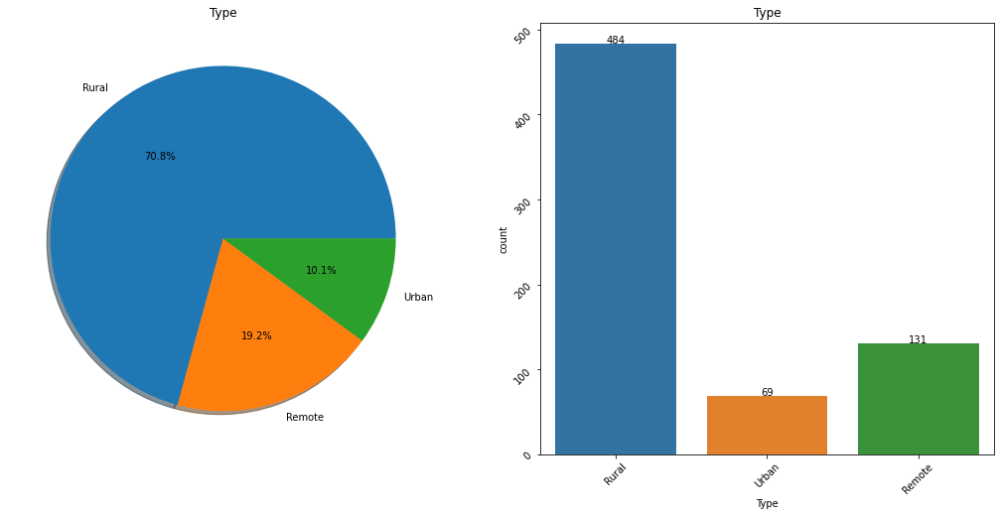

In [33]:
col = 'Type'
f,ax=plt.subplots(1,2,figsize=(18,8))
data_type[col].value_counts().plot.pie(autopct='%1.1f%%',ax=ax[0],shadow=True)
ax[0].set_title(col)
ax[0].set_ylabel('')
graph1=sns.countplot(col,data=data_type,ax=ax[1])
ax[1].set_title(col)
ax[1].tick_params(labelrotation=45)
for p in graph1.patches:
    height = p.get_height()
    graph1.text(p.get_x()+p.get_width()/2., height + 0.1, height,ha="center")
plt.show()

In [34]:
data_type['label'] = data_type['Type'].map({'Rural': 0, 'Urban': 1, 'Remote': 2})

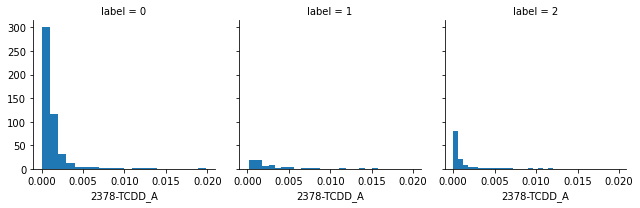

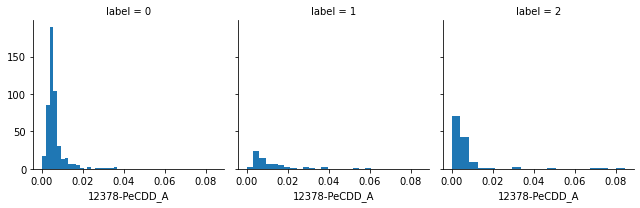

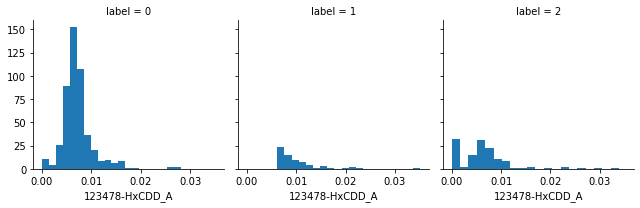

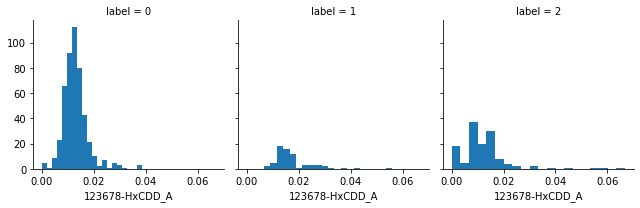

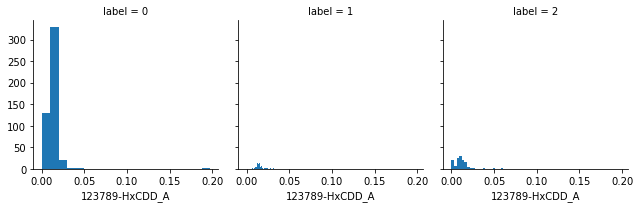

...

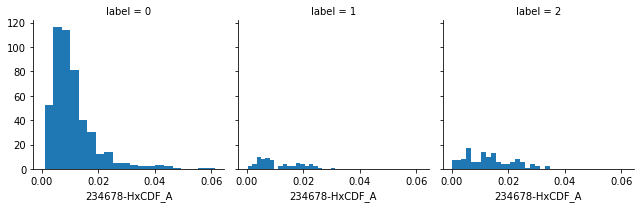

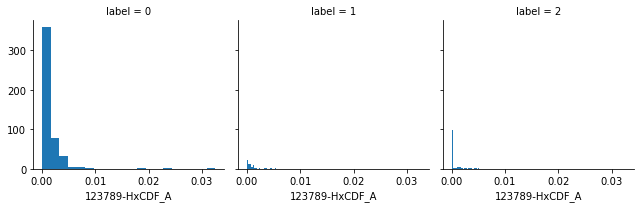

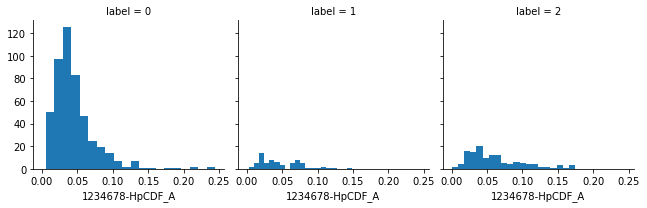

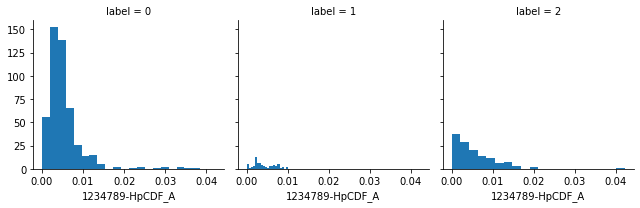

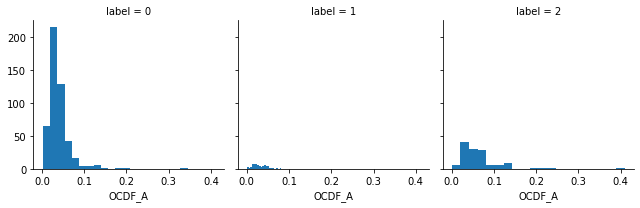

In [35]:
congenere = ['2378-TCDD_A', '12378-PeCDD_A', '123478-HxCDD_A', '123678-HxCDD_A',
       '123789-HxCDD_A', '1234678-HpCDD_A', 'OCDD_A', '2378-TCDF_A',
       '12378-PeCDF_A', '23478-PeCDF_A', '123478-HxCDF_A', '123678-HxCDF_A',
       '234678-HxCDF_A', '123789-HxCDF_A', '1234678-HpCDF_A',
       '1234789-HpCDF_A', 'OCDF_A']

for i in congenere:
    g = sns.FacetGrid(data_type, col='label')
    _= g.map(plt.hist, i, bins=20)
    plt.show()

## IV.b Utilisation de classifieurs par type de sol

In [36]:
#importing all the required ML packages
from sklearn.linear_model import LogisticRegression #logistic regression
from sklearn import svm #support vector Machine
from sklearn.ensemble import RandomForestClassifier #Random Forest
from sklearn.neighbors import KNeighborsClassifier #KNN
from sklearn.naive_bayes import GaussianNB #Naive bayes
from sklearn.tree import DecisionTreeClassifier #Decision Tree
from sklearn.model_selection import train_test_split #training and testing data split
from sklearn import metrics #accuracy measure
from sklearn.metrics import confusion_matrix #for confusion matrix
from sklearn.model_selection import KFold #for K-fold cross validation
from sklearn.model_selection import cross_val_score #score evaluation
from sklearn.model_selection import cross_val_predict #prediction

### 1- Normalisation A

In [37]:
train,test=train_test_split(data_type,test_size=0.3,random_state=0,stratify=data_type['label'])
train_X=train[train.columns[5:22]]
train_Y=train[train.columns[-1:]]
test_X=test[test.columns[5:22]]
test_Y=test[test.columns[-1:]]
X=data_type[data_type.columns[5:22]]
Y=data_type['label']

{'Rural': 0, 'Urban': 1, 'Remote': 2}


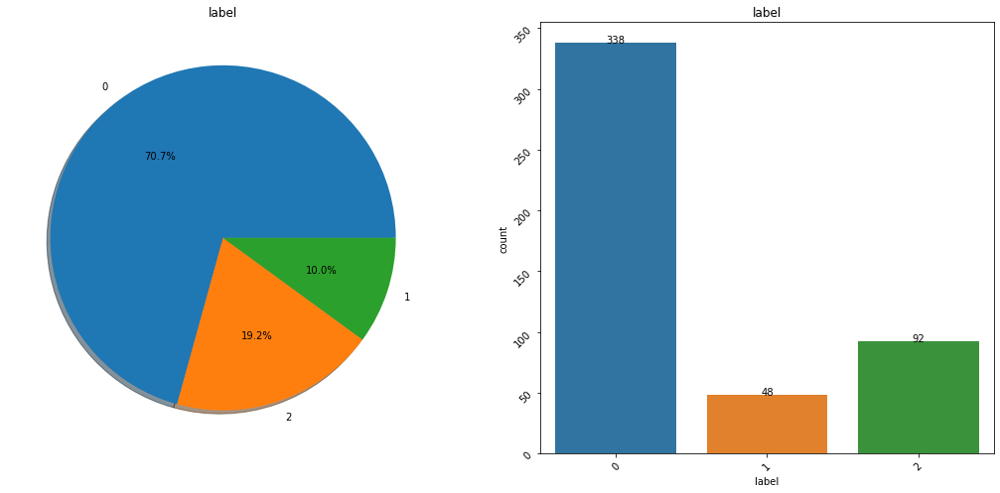

In [38]:
print({'Rural': 0, 'Urban': 1, 'Remote': 2})
col = 'label'
f,ax=plt.subplots(1,2,figsize=(18,8))
train_Y[col].value_counts().plot.pie(autopct='%1.1f%%',ax=ax[0],shadow=True)
ax[0].set_title(col)
ax[0].set_ylabel('')
graph1=sns.countplot(col,data=train_Y,ax=ax[1])
ax[1].set_title(col)
ax[1].tick_params(labelrotation=45)
for p in graph1.patches:
    height = p.get_height()
    graph1.text(p.get_x()+p.get_width()/2., height + 0.1, height,ha="center")
plt.show()

In [39]:
model = LogisticRegression()
model.fit(train_X,train_Y)
prediction3=model.predict(test_X)
print('The accuracy of the Logistic Regression is',metrics.accuracy_score(prediction3,test_Y))

The accuracy of the Logistic Regression is 0.7135922330097088


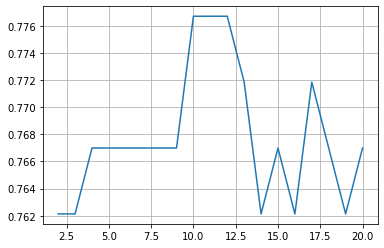

In [40]:
acc=[]
for i in range(2,21):
    model=DecisionTreeClassifier(max_leaf_nodes=i)
    model.fit(train_X,train_Y)
    prediction4=model.predict(test_X)
    acc.append(metrics.accuracy_score(prediction4,test_Y))
plt.plot(range(2,21), acc)
plt.grid()

In [41]:
model=DecisionTreeClassifier(max_leaf_nodes=6)
model.fit(train_X,train_Y)
prediction4=model.predict(test_X)
print('The accuracy of the Decision Tree is',metrics.accuracy_score(prediction4,test_Y))

The accuracy of the Decision Tree is 0.7669902912621359


In [42]:
for i,j in enumerate(train_X.columns):
    print(i, j)

0 2378-TCDD_A
1 12378-PeCDD_A
2 123478-HxCDD_A
3 123678-HxCDD_A
4 123789-HxCDD_A
5 1234678-HpCDD_A
6 OCDD_A
7 2378-TCDF_A
8 12378-PeCDF_A
9 23478-PeCDF_A
10 123478-HxCDF_A
11 123678-HxCDF_A
12 234678-HxCDF_A
13 123789-HxCDF_A
14 1234678-HpCDF_A
15 1234789-HpCDF_A
16 OCDF_A


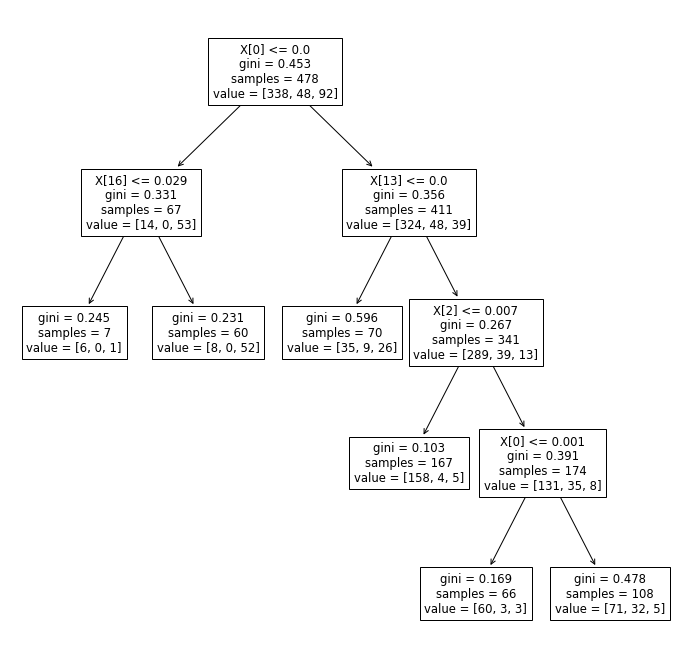

In [43]:
from sklearn import tree
fig, ax = plt.subplots(figsize=(12, 12))
_=tree.plot_tree(model)

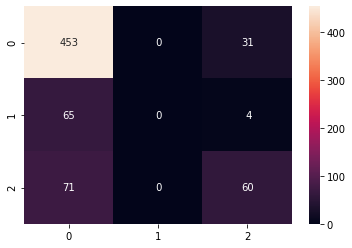

In [44]:
y_pred = cross_val_predict(DecisionTreeClassifier(max_leaf_nodes=6),X,Y,cv=10)
_=sns.heatmap(confusion_matrix(Y,y_pred),annot=True,fmt='2.0f')

In [45]:
Y

0      0
1      0
2      0
3      0
4      0
      ..
679    0
680    0
681    0
682    0
683    0
Name: label, Length: 684, dtype: int64

In [46]:
kfold = KFold(n_splits=5, random_state=0) # k=10, split the data into 10 equal parts
xyz=[]
accuracy=[]
std=[]
classifiers=['Linear Svm','Radial Svm','Logistic Regression','KNN','Decision Tree','Naive Bayes','Random Forest']
models=[svm.SVC(kernel='linear'),svm.SVC(kernel='rbf'),LogisticRegression(),KNeighborsClassifier(n_neighbors=9),DecisionTreeClassifier(max_leaf_nodes=6),GaussianNB(),RandomForestClassifier(n_estimators=100)]
for i in models:
    model = i
    cv_result = cross_val_score(model,X,Y, cv = kfold, scoring = "accuracy")
    cv_result=cv_result
    xyz.append(cv_result.mean())
    std.append(cv_result.std())
    accuracy.append(cv_result)
new_models_dataframe2=pd.DataFrame({'CV Mean':xyz,'Std':std},index=classifiers)       
new_models_dataframe2

,CV Mean,Std
Linear Svm,0.707342,0.115355
Radial Svm,0.705882,0.115752
Logistic Regression,0.702963,0.115845
KNN,0.685423,0.098716
Decision Tree,0.705990,0.064786
Naive Bayes,0.676696,0.112721
Random Forest,0.736614,0.085979


In [47]:
sols = {'Rural': 0, 'Urban': 1, 'Remote': 2}

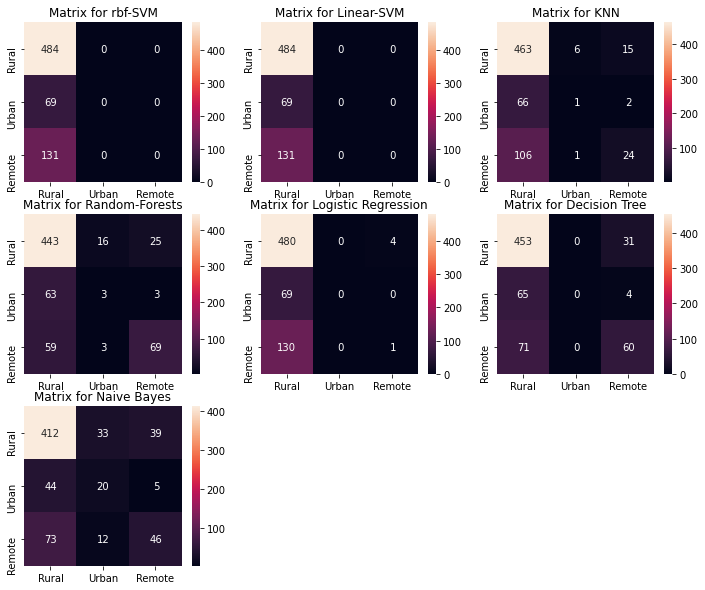

In [48]:
f,ax=plt.subplots(3,3,figsize=(12,10))
y_pred = cross_val_predict(svm.SVC(kernel='rbf'),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[0,0],annot=True,fmt='2.0f')
ax[0,0].set_title('Matrix for rbf-SVM')
ax[0,0].xaxis.set_ticklabels([sol for sol in sols.keys()])
ax[0,0].yaxis.set_ticklabels([sol for sol in sols.keys()])

y_pred = cross_val_predict(svm.SVC(kernel='linear'),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[0,1],annot=True,fmt='2.0f')
ax[0,1].set_title('Matrix for Linear-SVM')
ax[0,1].xaxis.set_ticklabels([sol for sol in sols.keys()])
ax[0,1].yaxis.set_ticklabels([sol for sol in sols.keys()])

y_pred = cross_val_predict(KNeighborsClassifier(n_neighbors=9),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[0,2],annot=True,fmt='2.0f')
ax[0,2].set_title('Matrix for KNN')
ax[0,2].xaxis.set_ticklabels([sol for sol in sols.keys()])
ax[0,2].yaxis.set_ticklabels([sol for sol in sols.keys()])

y_pred = cross_val_predict(RandomForestClassifier(n_estimators=100),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[1,0],annot=True,fmt='2.0f')
ax[1,0].set_title('Matrix for Random-Forests')
ax[1,0].xaxis.set_ticklabels([sol for sol in sols.keys()])
ax[1,0].yaxis.set_ticklabels([sol for sol in sols.keys()])

y_pred = cross_val_predict(LogisticRegression(),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[1,1],annot=True,fmt='2.0f')
ax[1,1].set_title('Matrix for Logistic Regression')
ax[1,1].xaxis.set_ticklabels([sol for sol in sols.keys()])
ax[1,1].yaxis.set_ticklabels([sol for sol in sols.keys()])

y_pred = cross_val_predict(DecisionTreeClassifier(max_leaf_nodes=6),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[1,2],annot=True,fmt='2.0f')
ax[1,2].set_title('Matrix for Decision Tree')
ax[1,2].xaxis.set_ticklabels([sol for sol in sols.keys()])
ax[1,2].yaxis.set_ticklabels([sol for sol in sols.keys()])

y_pred = cross_val_predict(GaussianNB(),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[2,0],annot=True,fmt='2.0f')
ax[2,0].set_title('Matrix for Naive Bayes')
ax[2,0].xaxis.set_ticklabels([sol for sol in sols.keys()])
ax[2,0].yaxis.set_ticklabels([sol for sol in sols.keys()])

plt.subplots_adjust(hspace=0.2,wspace=0.2)
f.delaxes(ax[2,1])
f.delaxes(ax[2,2])
plt.show()

In [49]:
y_pred = cross_val_predict(svm.SVC(kernel='rbf'),X,Y,cv=10)
print(classification_report(Y, y_pred))
y_pred = cross_val_predict(KNeighborsClassifier(n_neighbors=9),X,Y,cv=10)
print(classification_report(Y, y_pred))
y_pred = cross_val_predict(GaussianNB(),X,Y,cv=10)
print(classification_report(Y, y_pred))

              precision    recall  f1-score   support

           0       0.71      1.00      0.83       484
           1       0.00      0.00      0.00        69
           2       0.00      0.00      0.00       131

    accuracy                           0.71       684
   macro avg       0.24      0.33      0.28       684
weighted avg       0.50      0.71      0.59       684

              precision    recall  f1-score   support

           0       0.73      0.96      0.83       484
           1       0.12      0.01      0.03        69
           2       0.59      0.18      0.28       131

    accuracy                           0.71       684
   macro avg       0.48      0.38      0.38       684
weighted avg       0.64      0.71      0.64       684

              precision    recall  f1-score   support

           0       0.78      0.85      0.81       484
           1       0.31      0.29      0.30        69
           2       0.51      0.35      0.42       131

    accuracy        

### 2- Normalisation C:

In [50]:
data_type_C = data_type[data_type.columns[22:40]].copy()
data_type_C.dropna(inplace=True)
data_type_C.reset_index(drop=True, inplace=True)

In [51]:
train,test=train_test_split(data_type_C,test_size=0.3,random_state=0,stratify=data_type_C['label'])
train_X=train[train.columns[:17]]
train_Y=train[train.columns[-1:]]
test_X=test[test.columns[:17]]
test_Y=test[test.columns[-1:]]
X=data_type_C[data_type_C.columns[:17]]
Y=data_type_C['label']

{'Rural': 0, 'Urban': 1, 'Remote': 2}


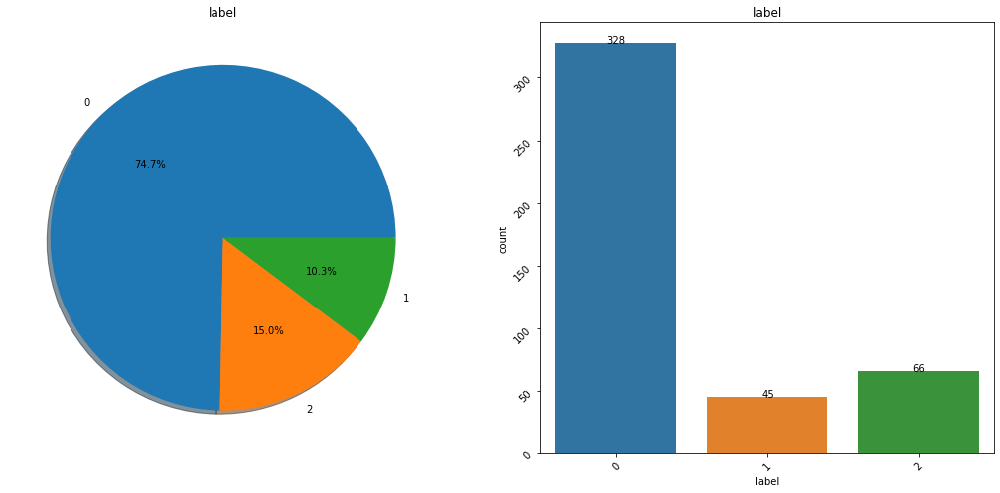

In [52]:
print({'Rural': 0, 'Urban': 1, 'Remote': 2})
col = 'label'
f,ax=plt.subplots(1,2,figsize=(18,8))
train_Y[col].value_counts().plot.pie(autopct='%1.1f%%',ax=ax[0],shadow=True)
ax[0].set_title(col)
ax[0].set_ylabel('')
graph1=sns.countplot(col,data=train_Y,ax=ax[1])
ax[1].set_title(col)
ax[1].tick_params(labelrotation=45)
for p in graph1.patches:
    height = p.get_height()
    graph1.text(p.get_x()+p.get_width()/2., height + 0.1, height,ha="center")
plt.show()

In [53]:
model = LogisticRegression()
model.fit(train_X,train_Y)
prediction3=model.predict(test_X)
print('The accuracy of the Logistic Regression is',metrics.accuracy_score(prediction3,test_Y))

The accuracy of the Logistic Regression is 0.7566137566137566


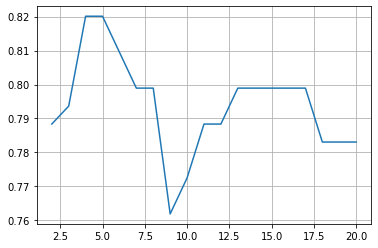

In [54]:
acc=[]
for i in range(2,21):
    model=DecisionTreeClassifier(max_leaf_nodes=i)
    model.fit(train_X,train_Y)
    prediction4=model.predict(test_X)
    acc.append(metrics.accuracy_score(prediction4,test_Y))
plt.plot(range(2,21), acc)
plt.grid()

In [55]:
model=DecisionTreeClassifier(max_leaf_nodes=6)
model.fit(train_X,train_Y)
prediction4=model.predict(test_X)
print('The accuracy of the Decision Tree is',metrics.accuracy_score(prediction4,test_Y))

The accuracy of the Decision Tree is 0.8095238095238095


In [56]:
for i,j in enumerate(train_X.columns):
    print(i, j)

0 2378-TCDD_C
1 12378-PeCDD_C
2 123478-HxCDD_C
3 123678-HxCDD_C
4 123789-HxCDD_C
5 1234678-HpCDD_C
6 OCDD_C
7 2378-TCDF_C
8 12378-PeCDF_C
9 23478-PeCDF_C
10 123478-HxCDF_C
11 123678-HxCDF_C
12 234678-HxCDF_C
13 123789-HxCDF_C
14 1234678-HpCDF_C
15 1234789-HpCDF_C
16 OCDF_C


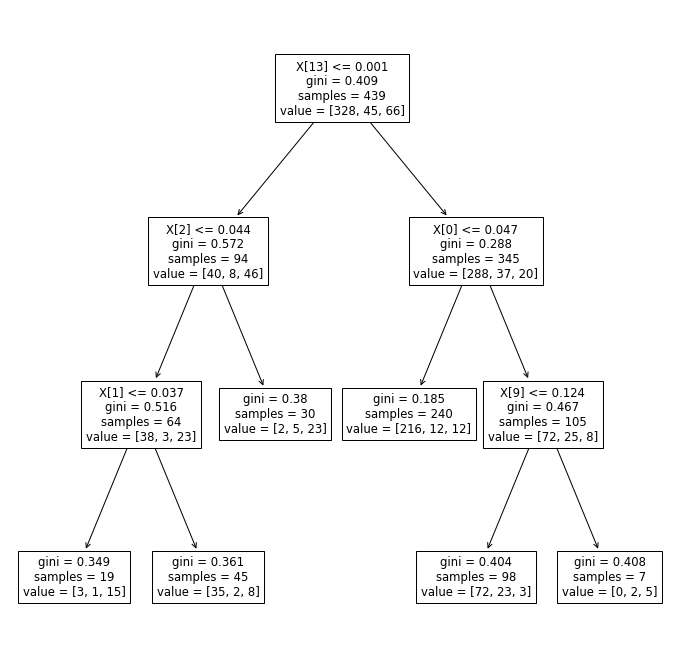

In [57]:
from sklearn import tree
fig, ax = plt.subplots(figsize=(12, 12))
_=tree.plot_tree(model)

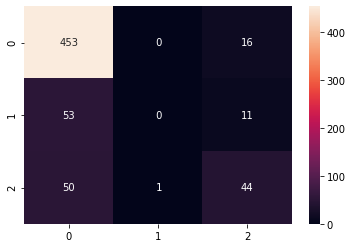

In [58]:
y_pred = cross_val_predict(DecisionTreeClassifier(max_leaf_nodes=6),X,Y,cv=10)
_=sns.heatmap(confusion_matrix(Y,y_pred),annot=True,fmt='2.0f')

In [59]:
kfold = KFold(n_splits=5, random_state=0) # k=10, split the data into 10 equal parts
xyz=[]
accuracy=[]
std=[]
classifiers=['Linear Svm','Radial Svm','Logistic Regression','KNN','Decision Tree','Naive Bayes','Random Forest']
models=[svm.SVC(kernel='linear'),svm.SVC(kernel='rbf'),LogisticRegression(),KNeighborsClassifier(n_neighbors=9),DecisionTreeClassifier(max_leaf_nodes=6),GaussianNB(),RandomForestClassifier(n_estimators=100)]
for i in models:
    model = i
    cv_result = cross_val_score(model,X,Y, cv = kfold, scoring = "accuracy")
    cv_result=cv_result
    xyz.append(cv_result.mean())
    std.append(cv_result.std())
    accuracy.append(cv_result)
new_models_dataframe2=pd.DataFrame({'CV Mean':xyz,'Std':std},index=classifiers)       
new_models_dataframe2

,CV Mean,Std
Linear Svm,0.746768,0.108410
Radial Svm,0.738806,0.103587
Logistic Regression,0.743594,0.107919
KNN,0.738844,0.065801
Decision Tree,0.722946,0.090646
Naive Bayes,0.654159,0.116919
Random Forest,0.749917,0.094069


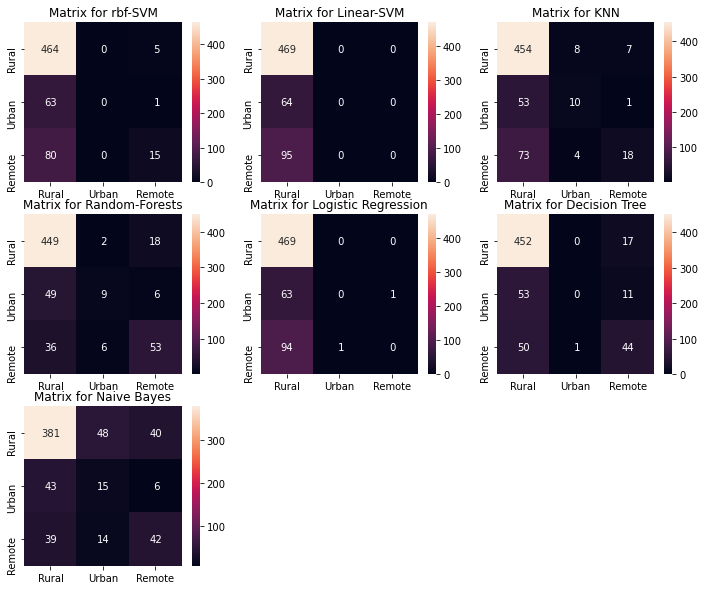

In [60]:
f,ax=plt.subplots(3,3,figsize=(12,10))
y_pred = cross_val_predict(svm.SVC(kernel='rbf'),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[0,0],annot=True,fmt='2.0f')
ax[0,0].set_title('Matrix for rbf-SVM')
ax[0,0].xaxis.set_ticklabels([sol for sol in sols.keys()])
ax[0,0].yaxis.set_ticklabels([sol for sol in sols.keys()])

y_pred = cross_val_predict(svm.SVC(kernel='linear'),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[0,1],annot=True,fmt='2.0f')
ax[0,1].set_title('Matrix for Linear-SVM')
ax[0,1].xaxis.set_ticklabels([sol for sol in sols.keys()])
ax[0,1].yaxis.set_ticklabels([sol for sol in sols.keys()])

y_pred = cross_val_predict(KNeighborsClassifier(n_neighbors=9),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[0,2],annot=True,fmt='2.0f')
ax[0,2].set_title('Matrix for KNN')
ax[0,2].xaxis.set_ticklabels([sol for sol in sols.keys()])
ax[0,2].yaxis.set_ticklabels([sol for sol in sols.keys()])

y_pred = cross_val_predict(RandomForestClassifier(n_estimators=100),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[1,0],annot=True,fmt='2.0f')
ax[1,0].set_title('Matrix for Random-Forests')
ax[1,0].xaxis.set_ticklabels([sol for sol in sols.keys()])
ax[1,0].yaxis.set_ticklabels([sol for sol in sols.keys()])

y_pred = cross_val_predict(LogisticRegression(),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[1,1],annot=True,fmt='2.0f')
ax[1,1].set_title('Matrix for Logistic Regression')
ax[1,1].xaxis.set_ticklabels([sol for sol in sols.keys()])
ax[1,1].yaxis.set_ticklabels([sol for sol in sols.keys()])

y_pred = cross_val_predict(DecisionTreeClassifier(max_leaf_nodes=6),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[1,2],annot=True,fmt='2.0f')
ax[1,2].set_title('Matrix for Decision Tree')
ax[1,2].xaxis.set_ticklabels([sol for sol in sols.keys()])
ax[1,2].yaxis.set_ticklabels([sol for sol in sols.keys()])

y_pred = cross_val_predict(GaussianNB(),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[2,0],annot=True,fmt='2.0f')
ax[2,0].set_title('Matrix for Naive Bayes')
ax[2,0].xaxis.set_ticklabels([sol for sol in sols.keys()])
ax[2,0].yaxis.set_ticklabels([sol for sol in sols.keys()])

plt.subplots_adjust(hspace=0.2,wspace=0.2)
f.delaxes(ax[2,1])
f.delaxes(ax[2,2])
plt.show()

# V. Classification 2 à 2 selon le type de sol

## V.a Description type de sol (Remote vs Urban)

In [61]:
data_type_re_u = data.copy()
data_type_re_u = data_type_re_u[data_type_re_u['Type']!='Rural']

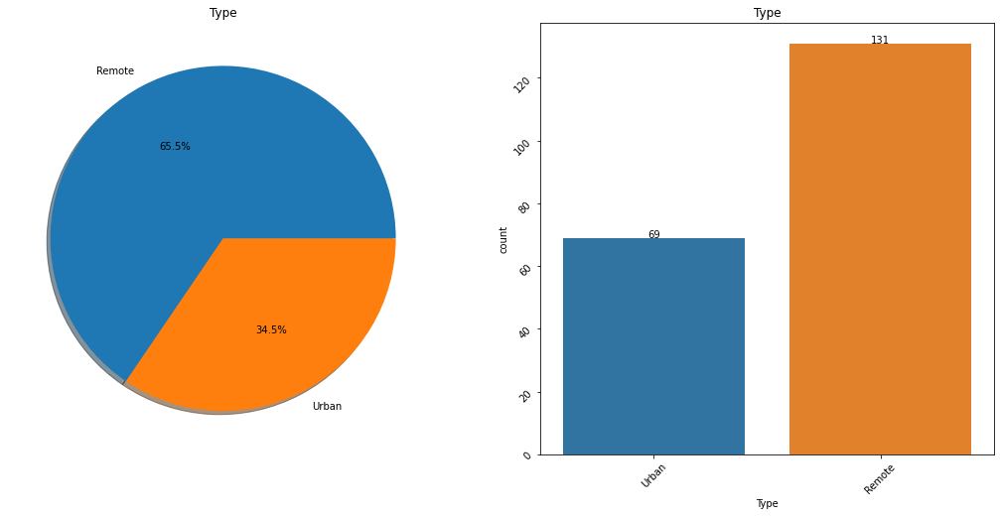

In [62]:
col = 'Type'
f,ax=plt.subplots(1,2,figsize=(18,8))
data_type_re_u[col].value_counts().plot.pie(autopct='%1.1f%%',ax=ax[0],shadow=True)
ax[0].set_title(col)
ax[0].set_ylabel('')
graph1=sns.countplot(col,data=data_type_re_u,ax=ax[1])
ax[1].set_title(col)
ax[1].tick_params(labelrotation=45)
for p in graph1.patches:
    height = p.get_height()
    graph1.text(p.get_x()+p.get_width()/2., height + 0.1, height,ha="center")
plt.show()

In [63]:
data_type_re_u['label'] = data_type_re_u['Type'].map({'Rural': 0, 'Urban': 1, 'Remote': 2})

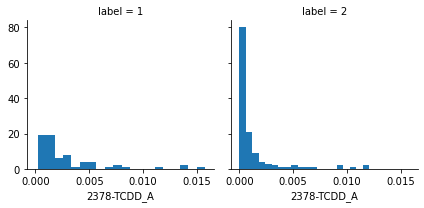

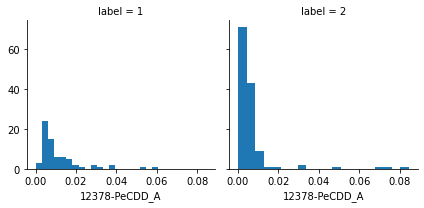

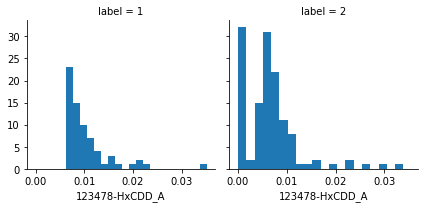

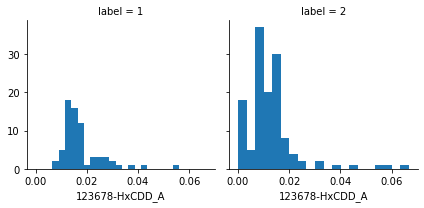

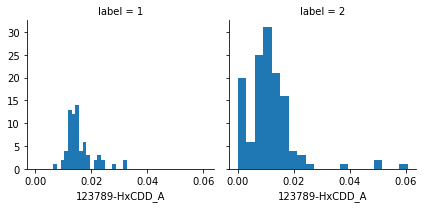

...

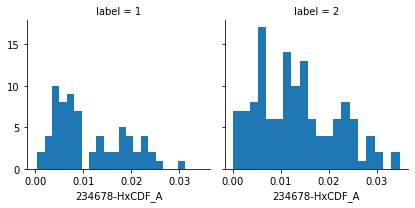

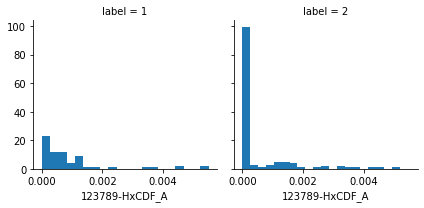

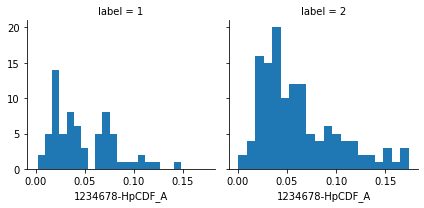

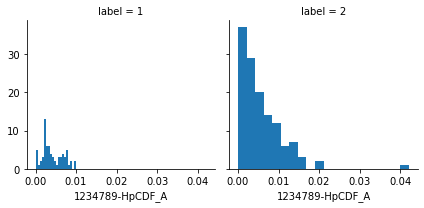

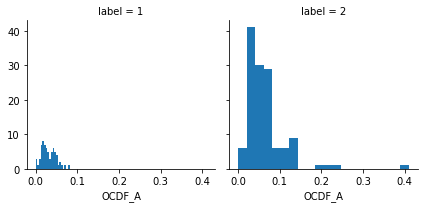

In [64]:
congenere = ['2378-TCDD_A', '12378-PeCDD_A', '123478-HxCDD_A', '123678-HxCDD_A',
       '123789-HxCDD_A', '1234678-HpCDD_A', 'OCDD_A', '2378-TCDF_A',
       '12378-PeCDF_A', '23478-PeCDF_A', '123478-HxCDF_A', '123678-HxCDF_A',
       '234678-HxCDF_A', '123789-HxCDF_A', '1234678-HpCDF_A',
       '1234789-HpCDF_A', 'OCDF_A']

for i in congenere:
    g = sns.FacetGrid(data_type_re_u, col='label')
    _= g.map(plt.hist, i, bins=20)
    plt.show()

## V.b Classification type de sol (Remote vs Urban)

In [65]:
#importing all the required ML packages
from sklearn.linear_model import LogisticRegression #logistic regression
from sklearn import svm #support vector Machine
from sklearn.ensemble import RandomForestClassifier #Random Forest
from sklearn.neighbors import KNeighborsClassifier #KNN
from sklearn.naive_bayes import GaussianNB #Naive bayes
from sklearn.tree import DecisionTreeClassifier #Decision Tree
from sklearn.model_selection import train_test_split #training and testing data split
from sklearn import metrics #accuracy measure
from sklearn.metrics import confusion_matrix #for confusion matrix
from sklearn.model_selection import KFold #for K-fold cross validation
from sklearn.model_selection import cross_val_score #score evaluation
from sklearn.model_selection import cross_val_predict #prediction

### 1- Normalisation A

In [66]:
train,test=train_test_split(data_type_re_u,test_size=0.3,random_state=0,stratify=data_type_re_u['label'])
train_X=train[train.columns[5:22]]
train_Y=train[train.columns[-1:]]
test_X=test[test.columns[5:22]]
test_Y=test[test.columns[-1:]]
X=data_type_re_u[data_type_re_u.columns[5:22]]
Y=data_type_re_u['label']

{'Rural': 0, 'Urban': 1, 'Remote': 2}


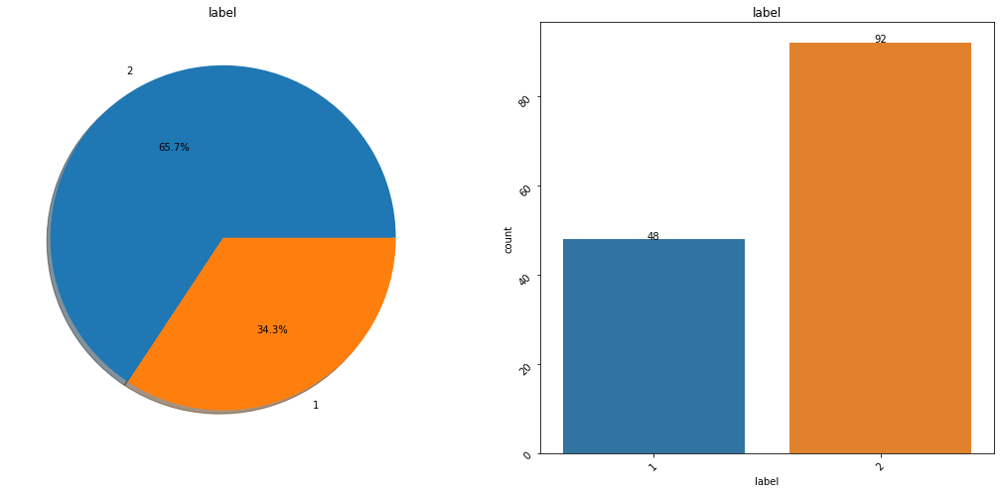

In [67]:
print({'Rural': 0, 'Urban': 1, 'Remote': 2})
col = 'label'
f,ax=plt.subplots(1,2,figsize=(18,8))
train_Y[col].value_counts().plot.pie(autopct='%1.1f%%',ax=ax[0],shadow=True)
ax[0].set_title(col)
ax[0].set_ylabel('')
graph1=sns.countplot(col,data=train_Y,ax=ax[1])
ax[1].set_title(col)
ax[1].tick_params(labelrotation=45)
for p in graph1.patches:
    height = p.get_height()
    graph1.text(p.get_x()+p.get_width()/2., height + 0.1, height,ha="center")
plt.show()

In [68]:
model = LogisticRegression()
model.fit(train_X,train_Y)
prediction3=model.predict(test_X)
print('The accuracy of the Logistic Regression is',metrics.accuracy_score(prediction3,test_Y))

The accuracy of the Logistic Regression is 0.65


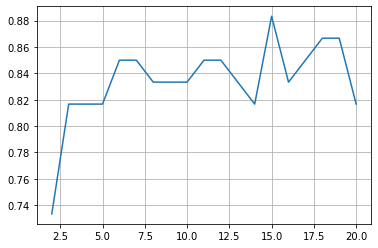

In [69]:
acc=[]
for i in range(2,21):
    model=DecisionTreeClassifier(max_leaf_nodes=i)
    model.fit(train_X,train_Y)
    prediction4=model.predict(test_X)
    acc.append(metrics.accuracy_score(prediction4,test_Y))
plt.plot(range(2,21), acc)
plt.grid()

In [70]:
model=DecisionTreeClassifier(max_leaf_nodes=6)
model.fit(train_X,train_Y)
prediction4=model.predict(test_X)
print('The accuracy of the Decision Tree is',metrics.accuracy_score(prediction4,test_Y))

The accuracy of the Decision Tree is 0.85


In [71]:
for i,j in enumerate(train_X.columns):
    print(i, j)

0 2378-TCDD_A
1 12378-PeCDD_A
2 123478-HxCDD_A
3 123678-HxCDD_A
4 123789-HxCDD_A
5 1234678-HpCDD_A
6 OCDD_A
7 2378-TCDF_A
8 12378-PeCDF_A
9 23478-PeCDF_A
10 123478-HxCDF_A
11 123678-HxCDF_A
12 234678-HxCDF_A
13 123789-HxCDF_A
14 1234678-HpCDF_A
15 1234789-HpCDF_A
16 OCDF_A


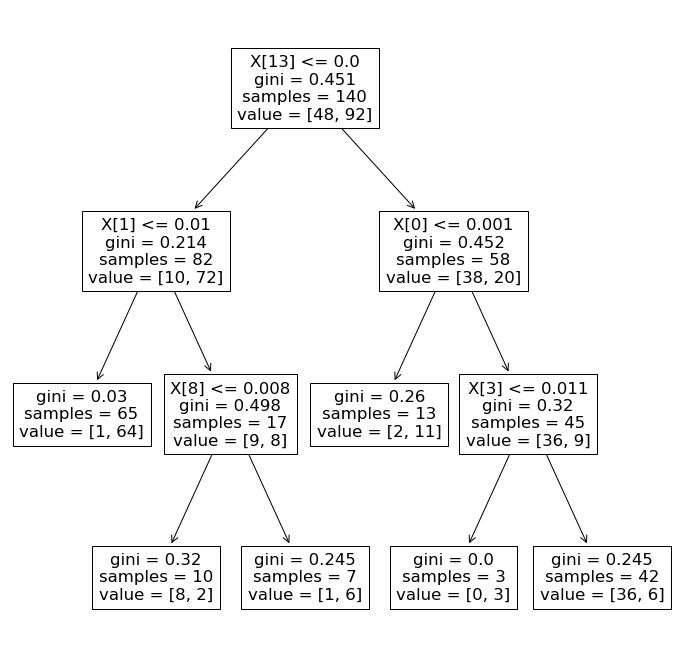

In [72]:
from sklearn import tree
fig, ax = plt.subplots(figsize=(12, 12))
_=tree.plot_tree(model)

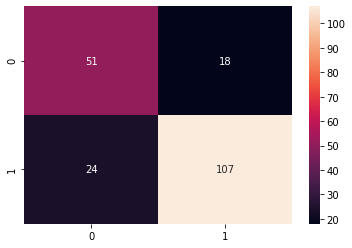

In [73]:
y_pred = cross_val_predict(DecisionTreeClassifier(max_leaf_nodes=6),X,Y,cv=10)
_=sns.heatmap(confusion_matrix(Y,y_pred),annot=True,fmt='2.0f')

In [74]:
kfold = KFold(n_splits=5, random_state=0) # k=10, split the data into 10 equal parts
xyz=[]
accuracy=[]
std=[]
classifiers=['Linear Svm','Radial Svm','Logistic Regression','KNN','Decision Tree','Naive Bayes','Random Forest']
models=[svm.SVC(kernel='linear'),svm.SVC(kernel='rbf'),LogisticRegression(),KNeighborsClassifier(n_neighbors=9),DecisionTreeClassifier(max_leaf_nodes=6),GaussianNB(),RandomForestClassifier(n_estimators=100)]
for i in models:
    model = i
    cv_result = cross_val_score(model,X,Y, cv = kfold, scoring = "accuracy")
    cv_result=cv_result
    xyz.append(cv_result.mean())
    std.append(cv_result.std())
    accuracy.append(cv_result)
#     print("Accuracy from each of 5 folds: ", cv_result)
#     print("Mean Accuracy: %.3f%%, Standard Deviation: (%.3f%%)" % (cv_result.mean()*100.0, cv_result.std()*100.0))
new_models_dataframe2=pd.DataFrame({'CV Mean':xyz,'Std':std},index=classifiers)       
new_models_dataframe2

,CV Mean,Std
Linear Svm,0.655,0.220454
Radial Svm,0.635,0.208327
Logistic Regression,0.655,0.220454
KNN,0.615,0.160935
Decision Tree,0.675,0.167332
Naive Bayes,0.615,0.116833
Random Forest,0.695,0.163095


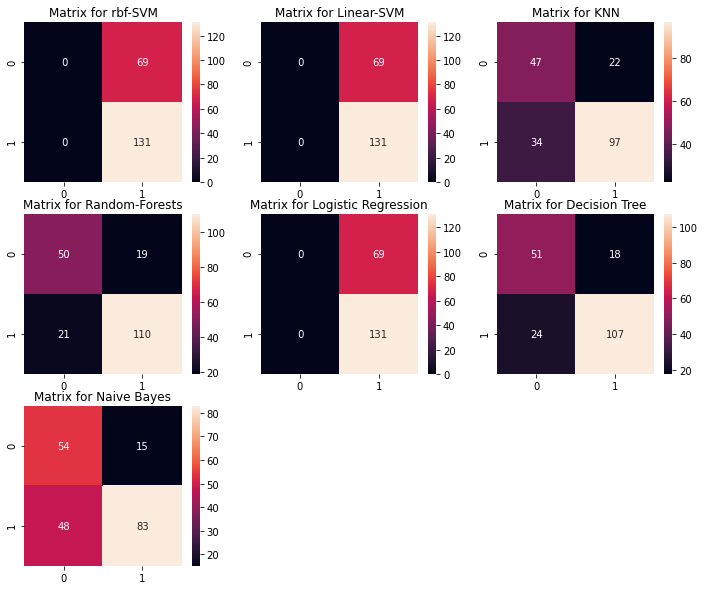

In [75]:
f,ax=plt.subplots(3,3,figsize=(12,10))
y_pred = cross_val_predict(svm.SVC(kernel='rbf'),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[0,0],annot=True,fmt='2.0f')
ax[0,0].set_title('Matrix for rbf-SVM')
y_pred = cross_val_predict(svm.SVC(kernel='linear'),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[0,1],annot=True,fmt='2.0f')
ax[0,1].set_title('Matrix for Linear-SVM')
y_pred = cross_val_predict(KNeighborsClassifier(n_neighbors=9),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[0,2],annot=True,fmt='2.0f')
ax[0,2].set_title('Matrix for KNN')
y_pred = cross_val_predict(RandomForestClassifier(n_estimators=100),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[1,0],annot=True,fmt='2.0f')
ax[1,0].set_title('Matrix for Random-Forests')
y_pred = cross_val_predict(LogisticRegression(),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[1,1],annot=True,fmt='2.0f')
ax[1,1].set_title('Matrix for Logistic Regression')
y_pred = cross_val_predict(DecisionTreeClassifier(max_leaf_nodes=6),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[1,2],annot=True,fmt='2.0f')
ax[1,2].set_title('Matrix for Decision Tree')
y_pred = cross_val_predict(GaussianNB(),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[2,0],annot=True,fmt='2.0f')
ax[2,0].set_title('Matrix for Naive Bayes')
plt.subplots_adjust(hspace=0.2,wspace=0.2)
f.delaxes(ax[2,1])
f.delaxes(ax[2,2])
plt.show()

### 2- Normalisation C:

In [76]:
data_type_re_u_C = data_type_re_u[data_type_re_u.columns[22:40]].copy()
data_type_re_u_C.dropna(inplace=True)
data_type_re_u_C.reset_index(drop=True, inplace=True)

In [77]:
train,test=train_test_split(data_type_re_u_C,test_size=0.3,random_state=0,stratify=data_type_re_u_C['label'])
train_X=train[train.columns[:17]]
train_Y=train[train.columns[-1:]]
test_X=test[test.columns[:17]]
test_Y=test[test.columns[-1:]]
X=data_type_re_u_C[data_type_re_u_C.columns[:17]]
Y=data_type_re_u_C['label']

{'Rural': 0, 'Urban': 1, 'Remote': 2}


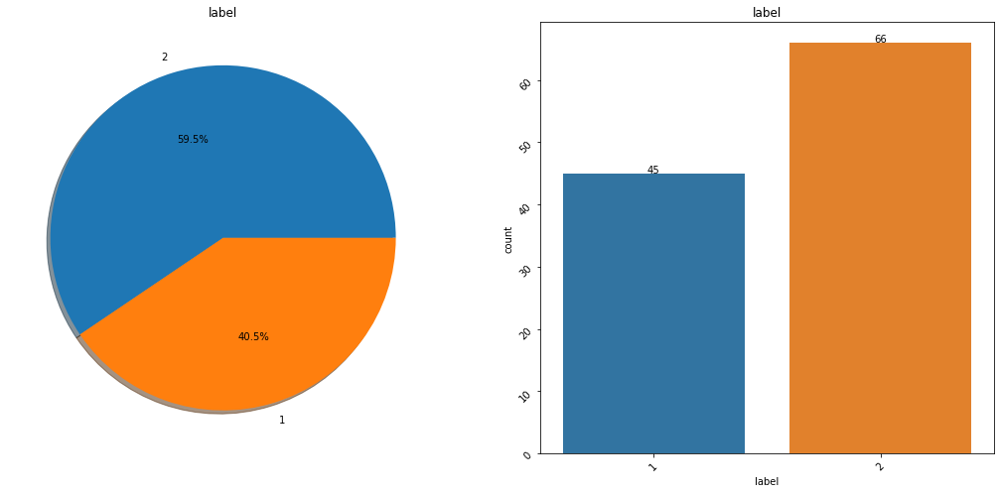

In [78]:
print({'Rural': 0, 'Urban': 1, 'Remote': 2})
col = 'label'
f,ax=plt.subplots(1,2,figsize=(18,8))
train_Y[col].value_counts().plot.pie(autopct='%1.1f%%',ax=ax[0],shadow=True)
ax[0].set_title(col)
ax[0].set_ylabel('')
graph1=sns.countplot(col,data=train_Y,ax=ax[1])
ax[1].set_title(col)
ax[1].tick_params(labelrotation=45)
for p in graph1.patches:
    height = p.get_height()
    graph1.text(p.get_x()+p.get_width()/2., height + 0.1, height,ha="center")
plt.show()

In [79]:
model = LogisticRegression()
model.fit(train_X,train_Y)
prediction3=model.predict(test_X)
print('The accuracy of the Logistic Regression is',metrics.accuracy_score(prediction3,test_Y))

The accuracy of the Logistic Regression is 0.6041666666666666


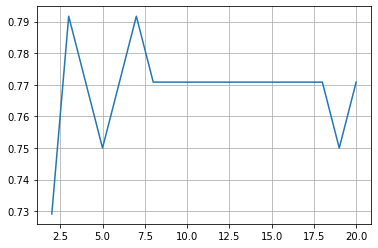

In [80]:
acc=[]
for i in range(2,21):
    model=DecisionTreeClassifier(max_leaf_nodes=i)
    model.fit(train_X,train_Y)
    prediction4=model.predict(test_X)
    acc.append(metrics.accuracy_score(prediction4,test_Y))
plt.plot(range(2,21), acc)
plt.grid()

In [81]:
model=DecisionTreeClassifier(max_leaf_nodes=3)
model.fit(train_X,train_Y)
prediction4=model.predict(test_X)
print('The accuracy of the Decision Tree is',metrics.accuracy_score(prediction4,test_Y))

The accuracy of the Decision Tree is 0.7916666666666666


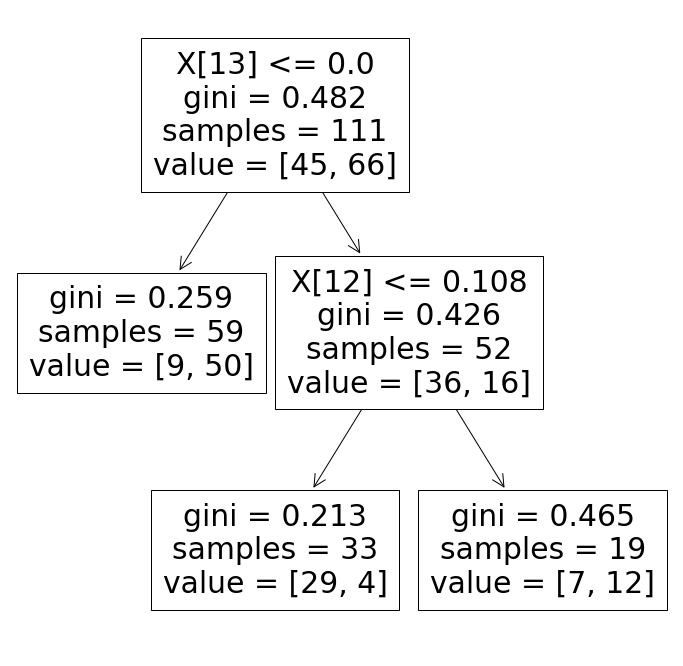

In [82]:
from sklearn import tree
fig, ax = plt.subplots(figsize=(12, 12))
_=tree.plot_tree(model)

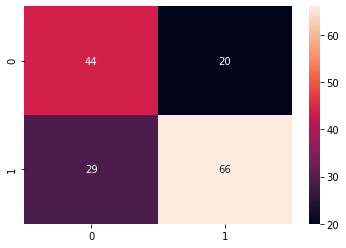

In [83]:
y_pred = cross_val_predict(DecisionTreeClassifier(max_leaf_nodes=3),X,Y,cv=10)
_=sns.heatmap(confusion_matrix(Y,y_pred),annot=True,fmt='2.0f')
# ax[1,2].set_title('Matrix for Decision Tree')

In [84]:
kfold = KFold(n_splits=5, random_state=0) # k=10, split the data into 10 equal parts
xyz=[]
accuracy=[]
std=[]
classifiers=['Linear Svm','Radial Svm','Logistic Regression','KNN','Decision Tree','Naive Bayes','Random Forest']
models=[svm.SVC(kernel='linear'),svm.SVC(kernel='rbf'),LogisticRegression(),KNeighborsClassifier(n_neighbors=9),DecisionTreeClassifier(max_leaf_nodes=3),GaussianNB(),RandomForestClassifier(n_estimators=100)]
for i in models:
    model = i
    cv_result = cross_val_score(model,X,Y, cv = kfold, scoring = "accuracy")
    cv_result=cv_result
    xyz.append(cv_result.mean())
    std.append(cv_result.std())
    accuracy.append(cv_result)
new_models_dataframe2=pd.DataFrame({'CV Mean':xyz,'Std':std},index=classifiers)       
new_models_dataframe2

,CV Mean,Std
Linear Svm,0.417137,0.174431
Radial Svm,0.422984,0.127983
Logistic Regression,0.409476,0.058145
KNN,0.673185,0.128433
Decision Tree,0.715726,0.142518
Naive Bayes,0.602621,0.092429
Random Forest,0.728831,0.128050


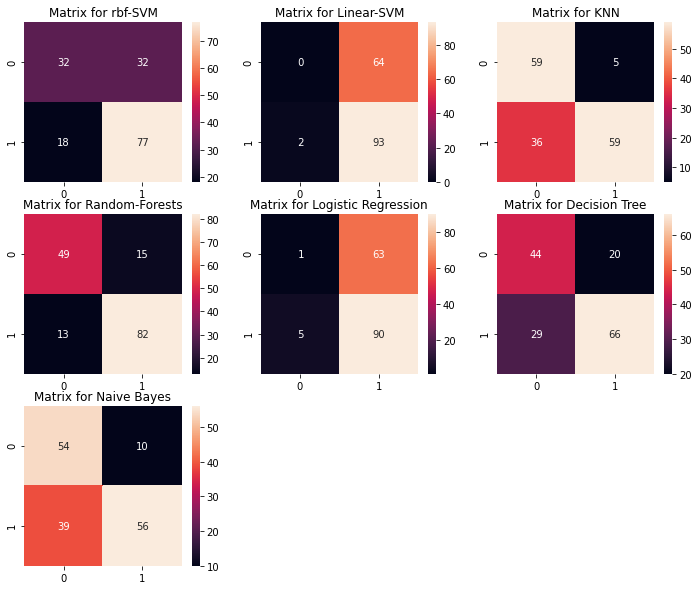

In [85]:
f,ax=plt.subplots(3,3,figsize=(12,10))
y_pred = cross_val_predict(svm.SVC(kernel='rbf'),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[0,0],annot=True,fmt='2.0f')
ax[0,0].set_title('Matrix for rbf-SVM')
y_pred = cross_val_predict(svm.SVC(kernel='linear'),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[0,1],annot=True,fmt='2.0f')
ax[0,1].set_title('Matrix for Linear-SVM')
y_pred = cross_val_predict(KNeighborsClassifier(n_neighbors=9),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[0,2],annot=True,fmt='2.0f')
ax[0,2].set_title('Matrix for KNN')
y_pred = cross_val_predict(RandomForestClassifier(n_estimators=100),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[1,0],annot=True,fmt='2.0f')
ax[1,0].set_title('Matrix for Random-Forests')
y_pred = cross_val_predict(LogisticRegression(),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[1,1],annot=True,fmt='2.0f')
ax[1,1].set_title('Matrix for Logistic Regression')
y_pred = cross_val_predict(DecisionTreeClassifier(max_leaf_nodes=3),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[1,2],annot=True,fmt='2.0f')
ax[1,2].set_title('Matrix for Decision Tree')
y_pred = cross_val_predict(GaussianNB(),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[2,0],annot=True,fmt='2.0f')
ax[2,0].set_title('Matrix for Naive Bayes')
plt.subplots_adjust(hspace=0.2,wspace=0.2)
f.delaxes(ax[2,1])
f.delaxes(ax[2,2])
plt.show()

## V.c Description type de sol (Rural vs Urban)

In [86]:
data_type_ru_u = data.copy()
data_type_ru_u = data_type_ru_u[data_type_ru_u['Type']!='Remote']

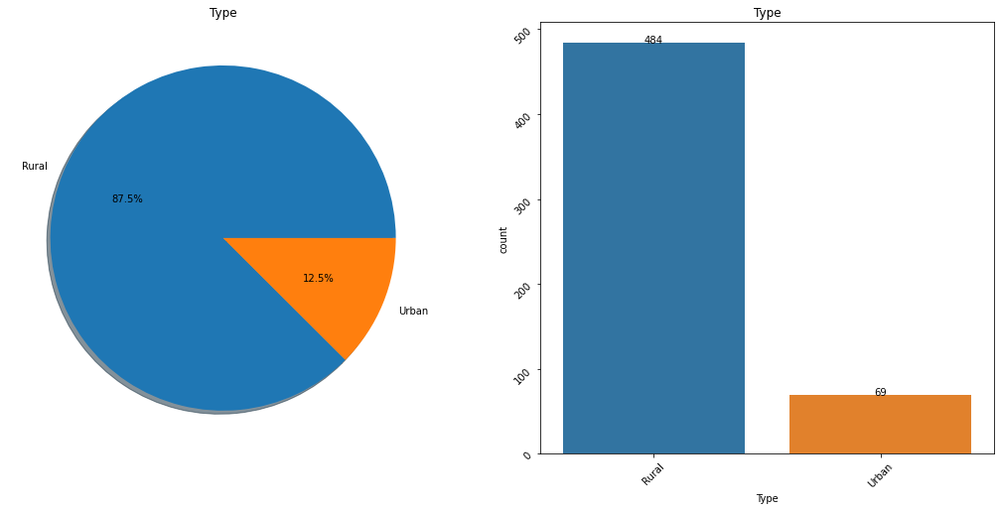

In [87]:
col = 'Type'
f,ax=plt.subplots(1,2,figsize=(18,8))
data_type_ru_u[col].value_counts().plot.pie(autopct='%1.1f%%',ax=ax[0],shadow=True)
ax[0].set_title(col)
ax[0].set_ylabel('')
graph1=sns.countplot(col,data=data_type_ru_u,ax=ax[1])
ax[1].set_title(col)
ax[1].tick_params(labelrotation=45)
for p in graph1.patches:
    height = p.get_height()
    graph1.text(p.get_x()+p.get_width()/2., height + 0.1, height,ha="center")
plt.show()

In [88]:
data_type_ru_u['label'] = data_type_ru_u['Type'].map({'Rural': 0, 'Urban': 1, 'Remote': 2})

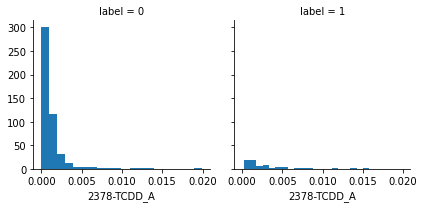

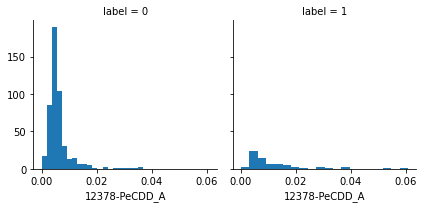

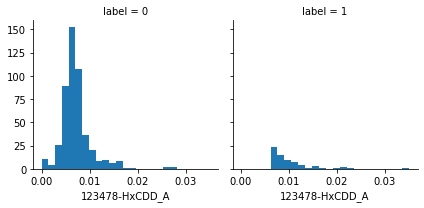

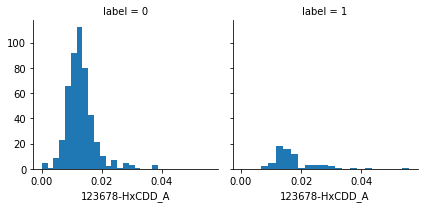

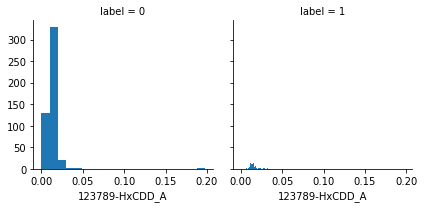

...

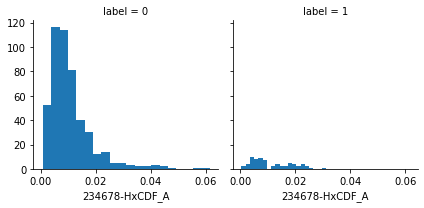

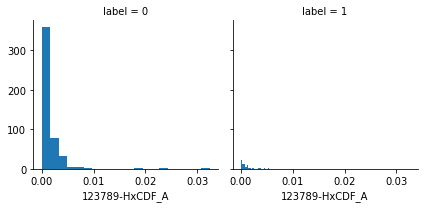

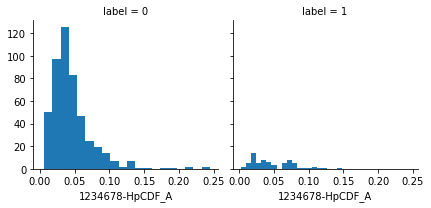

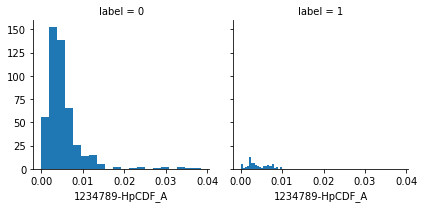

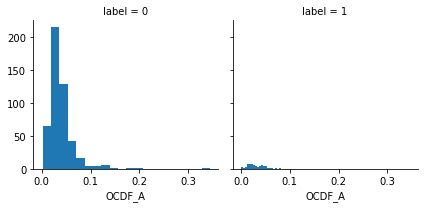

In [89]:
congenere = ['2378-TCDD_A', '12378-PeCDD_A', '123478-HxCDD_A', '123678-HxCDD_A',
       '123789-HxCDD_A', '1234678-HpCDD_A', 'OCDD_A', '2378-TCDF_A',
       '12378-PeCDF_A', '23478-PeCDF_A', '123478-HxCDF_A', '123678-HxCDF_A',
       '234678-HxCDF_A', '123789-HxCDF_A', '1234678-HpCDF_A',
       '1234789-HpCDF_A', 'OCDF_A']

for i in congenere:
    g = sns.FacetGrid(data_type_ru_u, col='label')
    _= g.map(plt.hist, i, bins=20)
    plt.show()

## V.d Classification type de sol (Rural vs Urban)

In [90]:
#importing all the required ML packages
from sklearn.linear_model import LogisticRegression #logistic regression
from sklearn import svm #support vector Machine
from sklearn.ensemble import RandomForestClassifier #Random Forest
from sklearn.neighbors import KNeighborsClassifier #KNN
from sklearn.naive_bayes import GaussianNB #Naive bayes
from sklearn.tree import DecisionTreeClassifier #Decision Tree
from sklearn.model_selection import train_test_split #training and testing data split
from sklearn import metrics #accuracy measure
from sklearn.metrics import confusion_matrix #for confusion matrix
from sklearn.model_selection import KFold #for K-fold cross validation
from sklearn.model_selection import cross_val_score #score evaluation
from sklearn.model_selection import cross_val_predict #prediction

### 1- Normalisation A

In [91]:
train,test=train_test_split(data_type_ru_u,test_size=0.3,random_state=0,stratify=data_type_ru_u['label'])
train_X=train[train.columns[5:22]]
train_Y=train[train.columns[-1:]]
test_X=test[test.columns[5:22]]
test_Y=test[test.columns[-1:]]
X=data_type_ru_u[data_type_ru_u.columns[5:22]]
Y=data_type_ru_u['label']

{'Rural': 0, 'Urban': 1, 'Remote': 2}


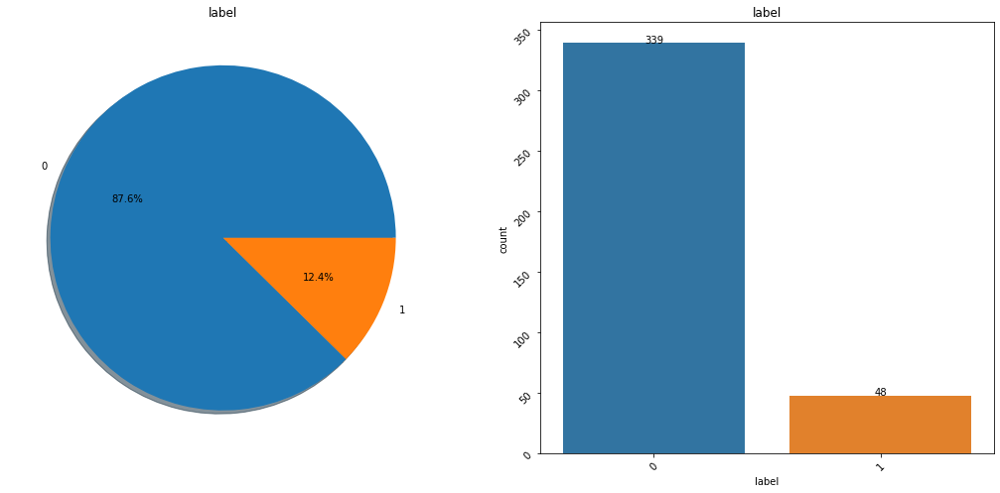

In [92]:
print({'Rural': 0, 'Urban': 1, 'Remote': 2})
col = 'label'
f,ax=plt.subplots(1,2,figsize=(18,8))
train_Y[col].value_counts().plot.pie(autopct='%1.1f%%',ax=ax[0],shadow=True)
ax[0].set_title(col)
ax[0].set_ylabel('')
graph1=sns.countplot(col,data=train_Y,ax=ax[1])
ax[1].set_title(col)
ax[1].tick_params(labelrotation=45)
for p in graph1.patches:
    height = p.get_height()
    graph1.text(p.get_x()+p.get_width()/2., height + 0.1, height,ha="center")
plt.show()

In [93]:
model = LogisticRegression()
model.fit(train_X,train_Y)
prediction3=model.predict(test_X)
print('The accuracy of the Logistic Regression is',metrics.accuracy_score(prediction3,test_Y))

The accuracy of the Logistic Regression is 0.8734939759036144


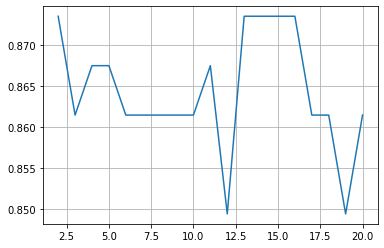

In [94]:
acc=[]
for i in range(2,21):
    model=DecisionTreeClassifier(max_leaf_nodes=i)
    model.fit(train_X,train_Y)
    prediction4=model.predict(test_X)
    acc.append(metrics.accuracy_score(prediction4,test_Y))
plt.plot(range(2,21), acc)
plt.grid()

In [95]:
model=DecisionTreeClassifier(max_leaf_nodes=5)
model.fit(train_X,train_Y)
prediction4=model.predict(test_X)
print('The accuracy of the Decision Tree is',metrics.accuracy_score(prediction4,test_Y))

The accuracy of the Decision Tree is 0.8674698795180723


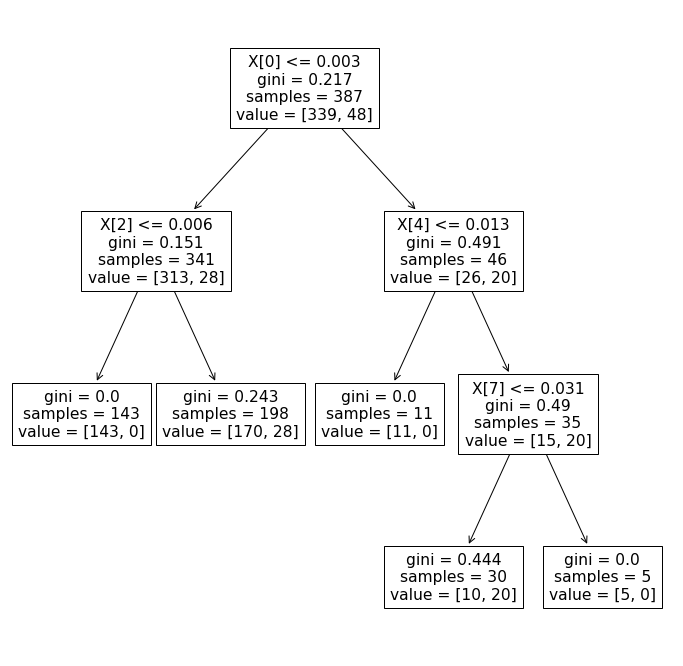

In [96]:
from sklearn import tree
fig, ax = plt.subplots(figsize=(12, 12))
_=tree.plot_tree(model)

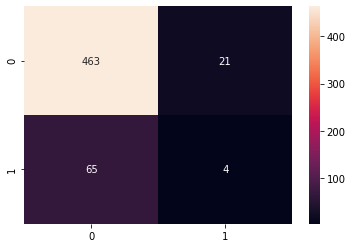

In [97]:
y_pred = cross_val_predict(DecisionTreeClassifier(max_leaf_nodes=5),X,Y,cv=10)
_=sns.heatmap(confusion_matrix(Y,y_pred),annot=True,fmt='2.0f')

In [98]:
kfold = KFold(n_splits=5, random_state=0) # k=10, split the data into 10 equal parts
xyz=[]
accuracy=[]
std=[]
classifiers=['Linear Svm','Radial Svm','Logistic Regression','KNN','Decision Tree','Naive Bayes','Random Forest']
models=[svm.SVC(kernel='linear'),svm.SVC(kernel='rbf'),LogisticRegression(),KNeighborsClassifier(n_neighbors=9),DecisionTreeClassifier(max_leaf_nodes=5),GaussianNB(),RandomForestClassifier(n_estimators=100)]
for i in models:
    model = i
    cv_result = cross_val_score(model,X,Y, cv = kfold, scoring = "accuracy")
    cv_result=cv_result
    xyz.append(cv_result.mean())
    std.append(cv_result.std())
    accuracy.append(cv_result)
new_models_dataframe2=pd.DataFrame({'CV Mean':xyz,'Std':std},index=classifiers)       
new_models_dataframe2

,CV Mean,Std
Linear Svm,0.875201,0.043243
Radial Svm,0.875201,0.043243
Logistic Regression,0.875201,0.043243
KNN,0.844488,0.037089
Decision Tree,0.821147,0.045310
Naive Bayes,0.799443,0.072094
Random Forest,0.830106,0.027689


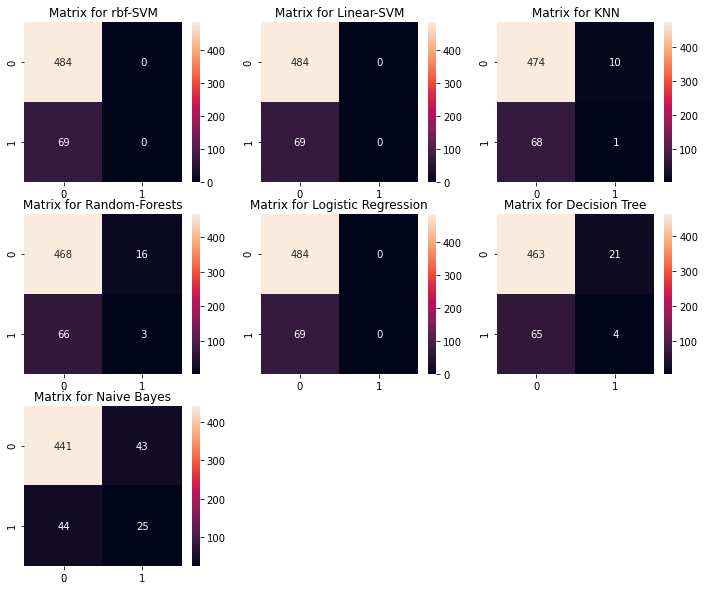

In [99]:
f,ax=plt.subplots(3,3,figsize=(12,10))
y_pred = cross_val_predict(svm.SVC(kernel='rbf'),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[0,0],annot=True,fmt='2.0f')
ax[0,0].set_title('Matrix for rbf-SVM')
y_pred = cross_val_predict(svm.SVC(kernel='linear'),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[0,1],annot=True,fmt='2.0f')
ax[0,1].set_title('Matrix for Linear-SVM')
y_pred = cross_val_predict(KNeighborsClassifier(n_neighbors=9),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[0,2],annot=True,fmt='2.0f')
ax[0,2].set_title('Matrix for KNN')
y_pred = cross_val_predict(RandomForestClassifier(n_estimators=100),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[1,0],annot=True,fmt='2.0f')
ax[1,0].set_title('Matrix for Random-Forests')
y_pred = cross_val_predict(LogisticRegression(),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[1,1],annot=True,fmt='2.0f')
ax[1,1].set_title('Matrix for Logistic Regression')
y_pred = cross_val_predict(DecisionTreeClassifier(max_leaf_nodes=5),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[1,2],annot=True,fmt='2.0f')
ax[1,2].set_title('Matrix for Decision Tree')
y_pred = cross_val_predict(GaussianNB(),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[2,0],annot=True,fmt='2.0f')
ax[2,0].set_title('Matrix for Naive Bayes')
plt.subplots_adjust(hspace=0.2,wspace=0.2)
f.delaxes(ax[2,1])
f.delaxes(ax[2,2])
plt.show()

### 2- Normalisation A with oversampling

In [100]:
data_type_ru_u = data.copy()
data_type_ru_u = data_type_ru_u[data_type_ru_u['Type']!='Remote']
data_type_ru_u['label'] = data_type_ru_u['Type'].map({'Rural': 0, 'Urban': 1, 'Remote': 2})

In [101]:
train,test=train_test_split(data_type_ru_u,test_size=0.3,random_state=0,stratify=data_type_ru_u['label'])
train_X=train[train.columns[5:22]]
train_Y=train[train.columns[-1:]]
test_X=test[test.columns[5:22]]
test_Y=test[test.columns[-1:]]
X=data_type_ru_u[data_type_ru_u.columns[5:22]]
Y=data_type_ru_u['label']

In [102]:
df = pd.concat([train_X,train_Y],axis=1)
df1 = df[df['label']==1]
df0 = df[df['label']==0]
df01 = df0.sample(150).reset_index(drop=True)
undersampled_df = pd.concat([df01,df1],axis=0).reset_index(drop=True)
train_X = undersampled_df[undersampled_df.columns[:17]]
train_Y = undersampled_df[undersampled_df.columns[-1:]]

In [103]:
from imblearn.over_sampling import SMOTE
sm = SMOTE(random_state=27, sampling_strategy={1:150})
train_X, train_Y = sm.fit_sample(train_X, train_Y)

{'Rural': 0, 'Urban': 1, 'Remote': 2}


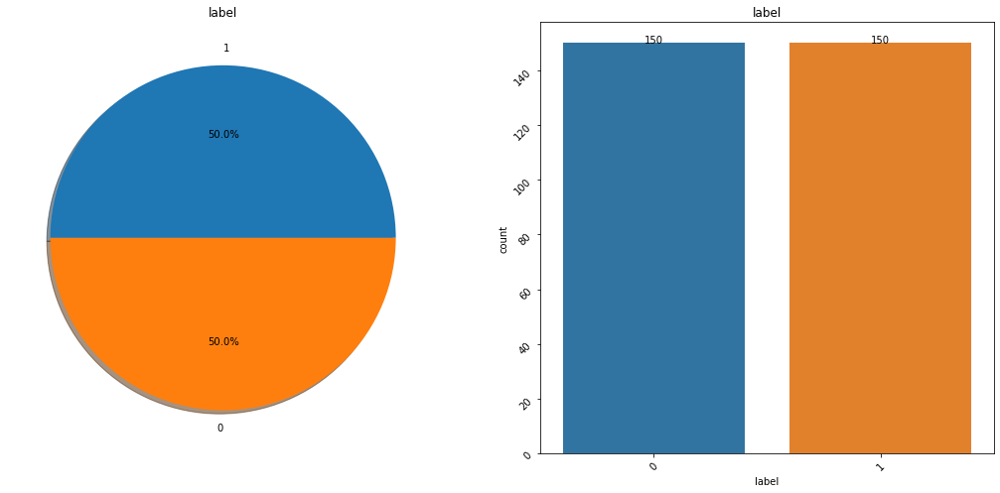

In [104]:
print({'Rural': 0, 'Urban': 1, 'Remote': 2})
col = 'label'
f,ax=plt.subplots(1,2,figsize=(18,8))
train_Y[col].value_counts().plot.pie(autopct='%1.1f%%',ax=ax[0],shadow=True)
ax[0].set_title(col)
ax[0].set_ylabel('')
graph1=sns.countplot(col,data=train_Y,ax=ax[1])
ax[1].set_title(col)
ax[1].tick_params(labelrotation=45)
for p in graph1.patches:
    height = p.get_height()
    graph1.text(p.get_x()+p.get_width()/2., height + 0.1, height,ha="center")
plt.show()

In [105]:
model = LogisticRegression()
model.fit(train_X,train_Y)
prediction3=model.predict(test_X)
print('The accuracy of the Logistic Regression is',metrics.accuracy_score(prediction3,test_Y))

The accuracy of the Logistic Regression is 0.6867469879518072


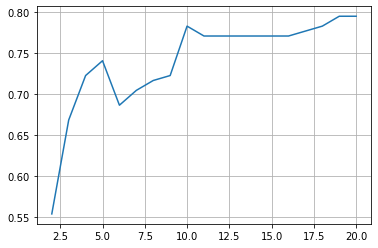

In [106]:
acc=[]
for i in range(2,21):
    model=DecisionTreeClassifier(max_leaf_nodes=i)
    model.fit(train_X,train_Y)
    prediction4=model.predict(test_X)
    acc.append(metrics.accuracy_score(prediction4,test_Y))
plt.plot(range(2,21), acc)
plt.grid()

In [107]:
model=DecisionTreeClassifier(max_leaf_nodes=4)
model.fit(train_X,train_Y)
prediction4=model.predict(test_X)
print('The accuracy of the Decision Tree is',metrics.accuracy_score(prediction4,test_Y))

The accuracy of the Decision Tree is 0.7228915662650602


In [108]:
for i,j in enumerate(train_X.columns):
    print(i, j)

0 2378-TCDD_A
1 12378-PeCDD_A
2 123478-HxCDD_A
3 123678-HxCDD_A
4 123789-HxCDD_A
5 1234678-HpCDD_A
6 OCDD_A
7 2378-TCDF_A
8 12378-PeCDF_A
9 23478-PeCDF_A
10 123478-HxCDF_A
11 123678-HxCDF_A
12 234678-HxCDF_A
13 123789-HxCDF_A
14 1234678-HpCDF_A
15 1234789-HpCDF_A
16 OCDF_A


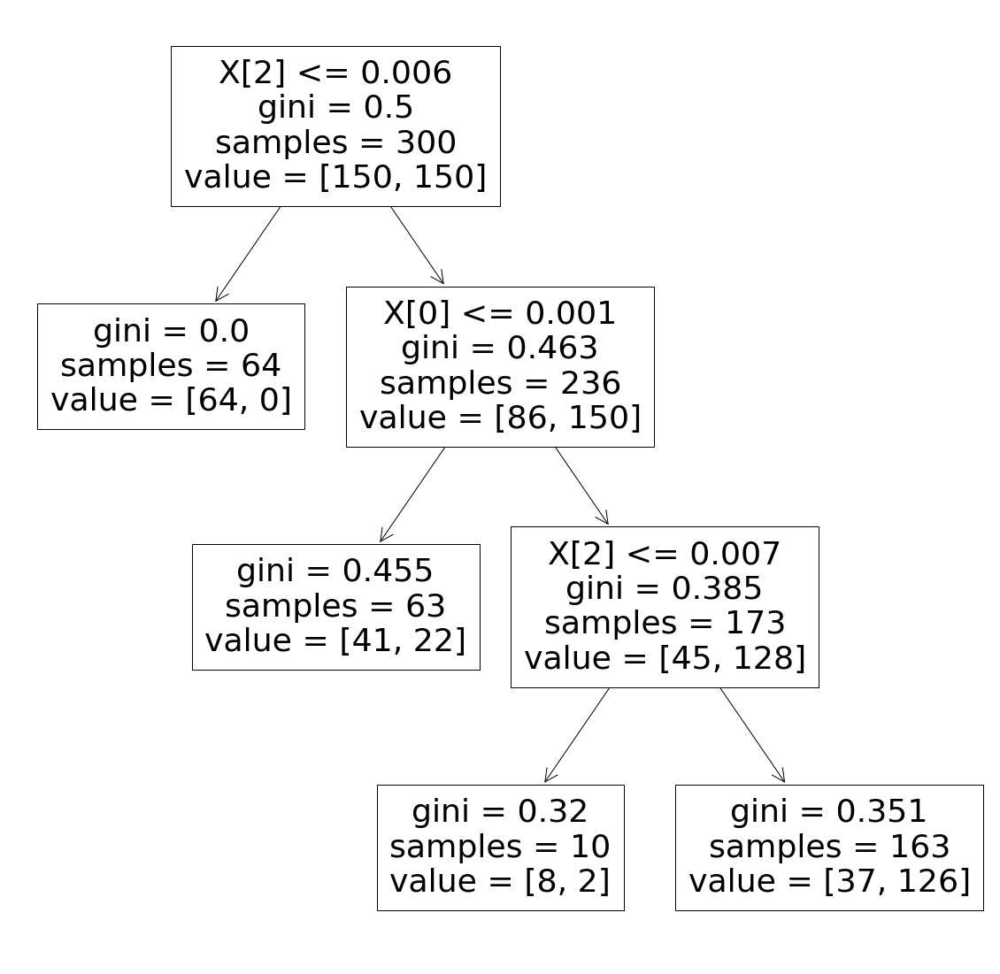

In [109]:
from sklearn import tree
fig, ax = plt.subplots(figsize=(20, 20))
_=tree.plot_tree(model)

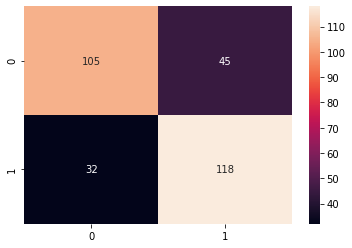

In [110]:
y_pred = cross_val_predict(DecisionTreeClassifier(max_leaf_nodes=4),train_X,train_Y,cv=10)
_=sns.heatmap(confusion_matrix(train_Y,y_pred),annot=True,fmt='2.0f')

In [111]:
kfold = KFold(n_splits=5, random_state=0) # k=10, split the data into 10 equal parts
xyz=[]
accuracy=[]
std=[]
classifiers=['Linear Svm','Radial Svm','Logistic Regression','KNN','Decision Tree','Naive Bayes','Random Forest']
models=[svm.SVC(kernel='linear'),svm.SVC(kernel='rbf'),LogisticRegression(),KNeighborsClassifier(n_neighbors=9),DecisionTreeClassifier(max_leaf_nodes=4),GaussianNB(),RandomForestClassifier(n_estimators=100)]
for i in models:
    model = i
    cv_result = cross_val_score(model,train_X,train_Y, cv = kfold, scoring = "accuracy")
    cv_result=cv_result
    xyz.append(cv_result.mean())
    std.append(cv_result.std())
    accuracy.append(cv_result)
new_models_dataframe2=pd.DataFrame({'CV Mean':xyz,'Std':std},index=classifiers)       
new_models_dataframe2

,CV Mean,Std
Linear Svm,0.126667,0.253333
Radial Svm,0.140000,0.271743
Logistic Regression,0.133333,0.266667
KNN,0.633333,0.128668
Decision Tree,0.673333,0.138082
Naive Bayes,0.593333,0.062004
Random Forest,0.850000,0.081650


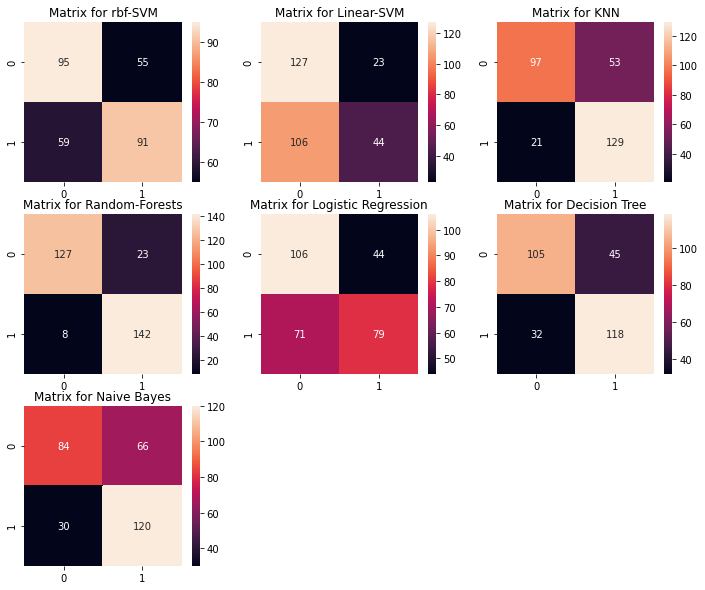

In [112]:
f,ax=plt.subplots(3,3,figsize=(12,10))
y_pred = cross_val_predict(svm.SVC(kernel='rbf'),train_X,train_Y,cv=10)
sns.heatmap(confusion_matrix(train_Y,y_pred),ax=ax[0,0],annot=True,fmt='2.0f')
ax[0,0].set_title('Matrix for rbf-SVM')
y_pred = cross_val_predict(svm.SVC(kernel='linear'),train_X,train_Y,cv=10)
sns.heatmap(confusion_matrix(train_Y,y_pred),ax=ax[0,1],annot=True,fmt='2.0f')
ax[0,1].set_title('Matrix for Linear-SVM')
y_pred = cross_val_predict(KNeighborsClassifier(n_neighbors=9),train_X,train_Y,cv=10)
sns.heatmap(confusion_matrix(train_Y,y_pred),ax=ax[0,2],annot=True,fmt='2.0f')
ax[0,2].set_title('Matrix for KNN')
y_pred = cross_val_predict(RandomForestClassifier(n_estimators=100),train_X,train_Y,cv=10)
sns.heatmap(confusion_matrix(train_Y,y_pred),ax=ax[1,0],annot=True,fmt='2.0f')
ax[1,0].set_title('Matrix for Random-Forests')
y_pred = cross_val_predict(LogisticRegression(),train_X,train_Y,cv=10)
sns.heatmap(confusion_matrix(train_Y,y_pred),ax=ax[1,1],annot=True,fmt='2.0f')
ax[1,1].set_title('Matrix for Logistic Regression')
y_pred = cross_val_predict(DecisionTreeClassifier(max_leaf_nodes=4),train_X,train_Y,cv=10)
sns.heatmap(confusion_matrix(train_Y,y_pred),ax=ax[1,2],annot=True,fmt='2.0f')
ax[1,2].set_title('Matrix for Decision Tree')
y_pred = cross_val_predict(GaussianNB(),train_X,train_Y,cv=10)
sns.heatmap(confusion_matrix(train_Y,y_pred),ax=ax[2,0],annot=True,fmt='2.0f')
ax[2,0].set_title('Matrix for Naive Bayes')
plt.subplots_adjust(hspace=0.2,wspace=0.2)
f.delaxes(ax[2,1])
f.delaxes(ax[2,2])
plt.show()

### 3- Normalisation C:

In [113]:
data_type_ru_u_C = data_type_ru_u[data_type_ru_u.columns[22:40]].copy()
data_type_ru_u_C.dropna(inplace=True)
data_type_ru_u_C.reset_index(drop=True, inplace=True)

In [114]:
train,test=train_test_split(data_type_ru_u_C,test_size=0.3,random_state=0,stratify=data_type_ru_u_C['label'])
train_X=train[train.columns[:17]]
train_Y=train[train.columns[-1:]]
test_X=test[test.columns[:17]]
test_Y=test[test.columns[-1:]]
X=data_type_ru_u_C[data_type_ru_u_C.columns[:17]]
Y=data_type_ru_u_C['label']

{'Rural': 0, 'Urban': 1, 'Remote': 2}


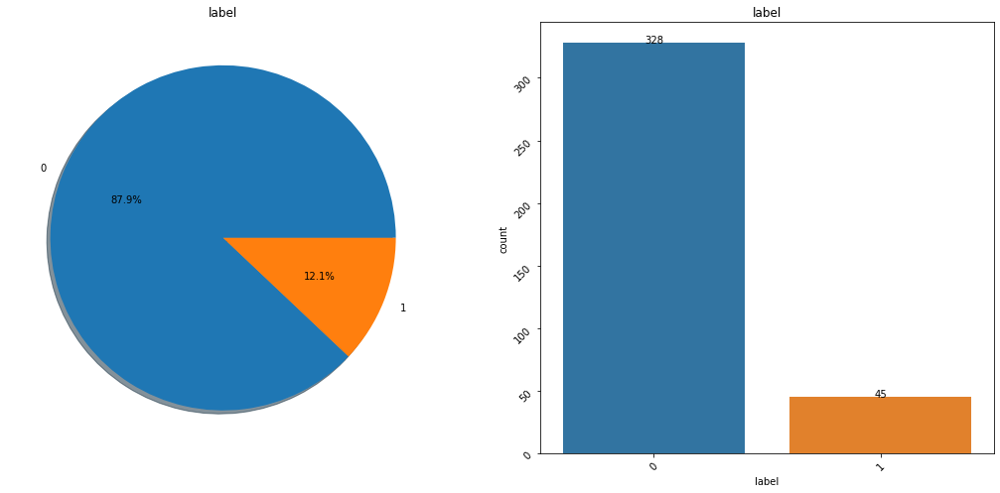

In [115]:
print({'Rural': 0, 'Urban': 1, 'Remote': 2})
col = 'label'
f,ax=plt.subplots(1,2,figsize=(18,8))
train_Y[col].value_counts().plot.pie(autopct='%1.1f%%',ax=ax[0],shadow=True)
ax[0].set_title(col)
ax[0].set_ylabel('')
graph1=sns.countplot(col,data=train_Y,ax=ax[1])
ax[1].set_title(col)
ax[1].tick_params(labelrotation=45)
for p in graph1.patches:
    height = p.get_height()
    graph1.text(p.get_x()+p.get_width()/2., height + 0.1, height,ha="center")
plt.show()

In [116]:
model = LogisticRegression()
model.fit(train_X,train_Y)
prediction3=model.predict(test_X)
print('The accuracy of the Logistic Regression is',metrics.accuracy_score(prediction3,test_Y))

The accuracy of the Logistic Regression is 0.88125


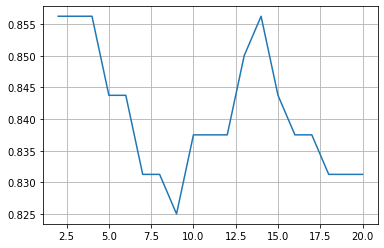

In [117]:
acc=[]
for i in range(2,21):
    model=DecisionTreeClassifier(max_leaf_nodes=i)
    model.fit(train_X,train_Y)
    prediction4=model.predict(test_X)
    acc.append(metrics.accuracy_score(prediction4,test_Y))
plt.plot(range(2,21), acc)
plt.grid()

In [118]:
model=DecisionTreeClassifier(max_leaf_nodes=3)
model.fit(train_X,train_Y)
prediction4=model.predict(test_X)
print('The accuracy of the Decision Tree is',metrics.accuracy_score(prediction4,test_Y))

The accuracy of the Decision Tree is 0.85625


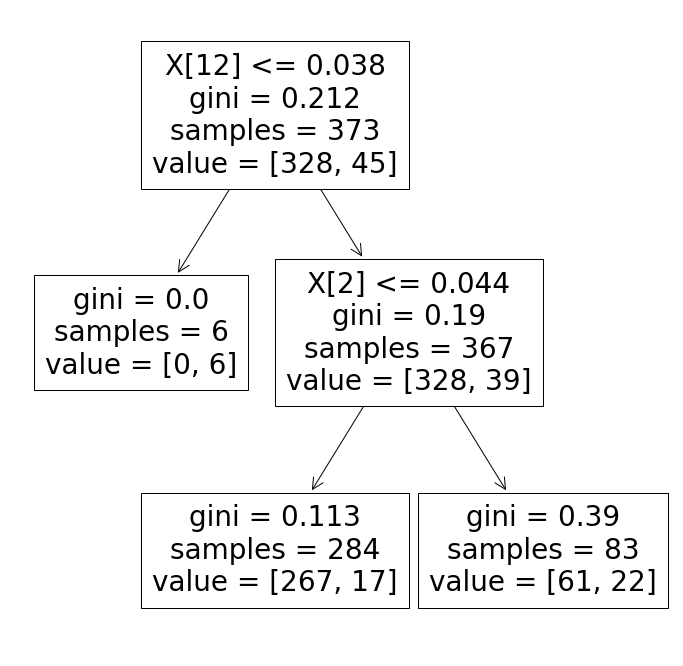

In [119]:
from sklearn import tree
fig, ax = plt.subplots(figsize=(12, 12))
_=tree.plot_tree(model)

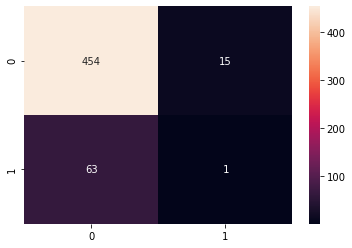

In [120]:
y_pred = cross_val_predict(DecisionTreeClassifier(max_leaf_nodes=3),X,Y,cv=10)
_=sns.heatmap(confusion_matrix(Y,y_pred),annot=True,fmt='2.0f')

In [121]:
kfold = KFold(n_splits=5, random_state=0) # k=10, split the data into 10 equal parts
xyz=[]
accuracy=[]
std=[]
classifiers=['Linear Svm','Radial Svm','Logistic Regression','KNN','Decision Tree','Naive Bayes','Random Forest']
models=[svm.SVC(kernel='linear'),svm.SVC(kernel='rbf'),LogisticRegression(),KNeighborsClassifier(n_neighbors=9),DecisionTreeClassifier(max_leaf_nodes=3),GaussianNB(),RandomForestClassifier(n_estimators=100)]
for i in models:
    model = i
    cv_result = cross_val_score(model,X,Y, cv = kfold, scoring = "accuracy")
    cv_result=cv_result
    xyz.append(cv_result.mean())
    std.append(cv_result.std())
    accuracy.append(cv_result)
new_models_dataframe2=pd.DataFrame({'CV Mean':xyz,'Std':std},index=classifiers)       
new_models_dataframe2

,CV Mean,Std
Linear Svm,0.879862,0.052828
Radial Svm,0.879862,0.052828
Logistic Regression,0.879862,0.052828
KNN,0.857327,0.044741
Decision Tree,0.851825,0.031864
Naive Bayes,0.765227,0.058305
Random Forest,0.881802,0.043687


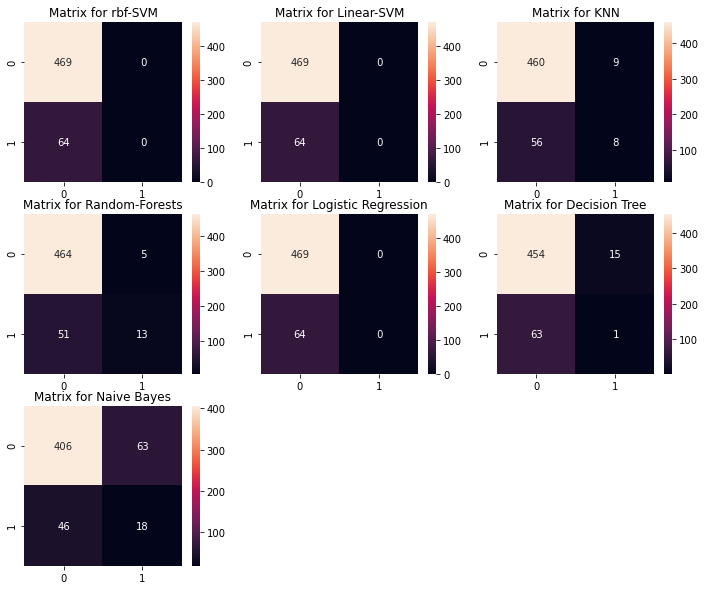

In [122]:
f,ax=plt.subplots(3,3,figsize=(12,10))
y_pred = cross_val_predict(svm.SVC(kernel='rbf'),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[0,0],annot=True,fmt='2.0f')
ax[0,0].set_title('Matrix for rbf-SVM')
y_pred = cross_val_predict(svm.SVC(kernel='linear'),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[0,1],annot=True,fmt='2.0f')
ax[0,1].set_title('Matrix for Linear-SVM')
y_pred = cross_val_predict(KNeighborsClassifier(n_neighbors=9),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[0,2],annot=True,fmt='2.0f')
ax[0,2].set_title('Matrix for KNN')
y_pred = cross_val_predict(RandomForestClassifier(n_estimators=100),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[1,0],annot=True,fmt='2.0f')
ax[1,0].set_title('Matrix for Random-Forests')
y_pred = cross_val_predict(LogisticRegression(),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[1,1],annot=True,fmt='2.0f')
ax[1,1].set_title('Matrix for Logistic Regression')
y_pred = cross_val_predict(DecisionTreeClassifier(max_leaf_nodes=3),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[1,2],annot=True,fmt='2.0f')
ax[1,2].set_title('Matrix for Decision Tree')
y_pred = cross_val_predict(GaussianNB(),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[2,0],annot=True,fmt='2.0f')
ax[2,0].set_title('Matrix for Naive Bayes')
plt.subplots_adjust(hspace=0.2,wspace=0.2)
f.delaxes(ax[2,1])
f.delaxes(ax[2,2])
plt.show()

### 4- Normalisation C with oversampling

In [123]:
data_type_ru_u_C = data_type_ru_u[data_type_ru_u.columns[22:40]].copy()
data_type_ru_u_C.dropna(inplace=True)
data_type_ru_u_C.reset_index(drop=True, inplace=True)

In [124]:
train,test=train_test_split(data_type_ru_u_C,test_size=0.3,random_state=0,stratify=data_type_ru_u_C['label'])
train_X=train[train.columns[:17]]
train_Y=train[train.columns[-1:]]
test_X=test[test.columns[:17]]
test_Y=test[test.columns[-1:]]
X=data_type_ru_u_C[data_type_ru_u_C.columns[:17]]
Y=data_type_ru_u_C['label']

In [125]:
df = pd.concat([train_X,train_Y],axis=1)
df1 = df[df['label']==1]
df0 = df[df['label']==0]
df01 = df0.sample(150).reset_index(drop=True)
undersampled_df = pd.concat([df01,df1],axis=0).reset_index(drop=True)
train_X = undersampled_df[undersampled_df.columns[:17]]
train_Y = undersampled_df[undersampled_df.columns[-1:]]

In [126]:
from imblearn.over_sampling import SMOTE
sm = SMOTE(random_state=27, sampling_strategy={1:150})
train_X, train_Y = sm.fit_sample(train_X, train_Y)

In [127]:
data_type_ru_u_C

,2378-TCDD_C,12378-PeCDD_C,123478-HxCDD_C,123678-HxCDD_C,123789-HxCDD_C,1234678-HpCDD_C,OCDD_C,2378-TCDF_C,12378-PeCDF_C,23478-PeCDF_C,123478-HxCDF_C,123678-HxCDF_C,234678-HxCDF_C,123789-HxCDF_C,1234678-HpCDF_C,1234789-HpCDF_C,OCDF_C,label
0,0.073863,0.130412,0.037128,0.113978,0.097972,0.526251,0.419069,0.023595,0.049179,0.083910,0.097516,0.089299,0.121542,0.039234,0.591566,0.101405,0.112344,0
1,0.000000,0.153816,0.039612,0.086161,0.088584,0.515062,0.586723,0.023244,0.053951,0.107521,0.114704,0.098839,0.153280,0.008508,0.589252,0.086995,0.134835,0
2,0.024280,0.126675,0.039954,0.067739,0.076786,0.446840,0.603423,0.022453,0.058426,0.102711,0.098298,0.093384,0.122239,0.009097,0.679278,0.090473,0.085569,0
3,0.024588,0.075588,0.044310,0.072243,0.080222,0.451521,0.614822,0.022666,0.047064,0.075411,0.095123,0.084858,0.123929,0.007522,0.529449,0.071093,0.122267,0
4,0.024711,0.077346,0.039048,0.068393,0.073947,0.430241,0.457275,0.022908,0.043259,0.078142,0.089360,0.082433,0.122302,0.009245,0.609080,0.100110,0.149043,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
528,0.033982,0.064494,0.038651,0.065096,0.061077,0.407904,0.441504,0.025390,0.031286,0.053433,0.071043,0.057881,0.083413,0.000000,0.522410,0.083441,0.068678,0
529,0.033245,0.058318,0.036299,0.056299,0.056457,0.383212,0.414299,0.030431,0.034286,0.046122,0.073829,0.066391,0.088705,0.000000,0.513986,0.063636,0.080768,0
530,0.042285,0.077051,0.035007,0.062299,0.067316,0.425368,0.444028,0.035151,0.052528,0.079051,0.080239,0.081251,0.096669,0.031623,0.473900,0.079744,0.055679,0
531,0.037628,0.096291,0.050870,0.068254,0.070632,0.386467,0.512055,0.033278,0.047645,0.069271,0.093754,0.078677,0.105492,0.018035,0.467754,0.079512,0.095510,0


{'Rural': 0, 'Urban': 1, 'Remote': 2}


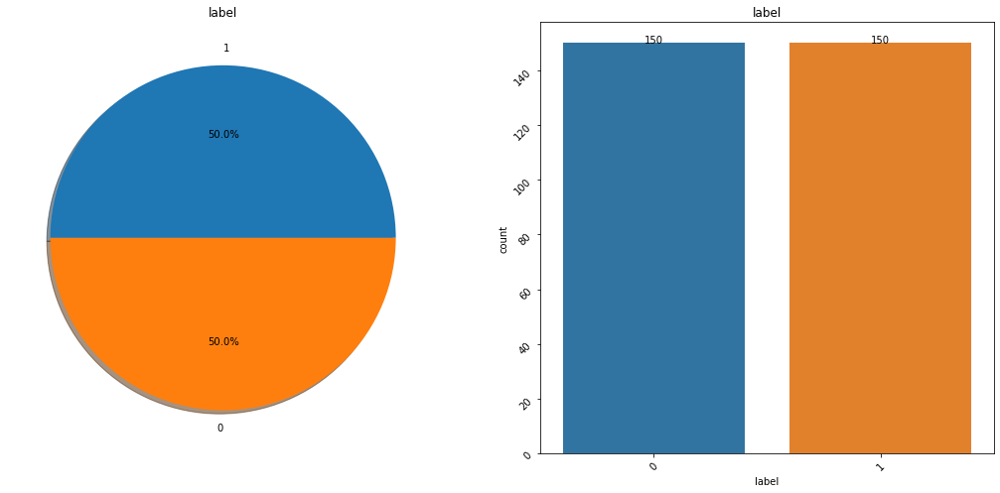

In [128]:
print({'Rural': 0, 'Urban': 1, 'Remote': 2})
col = 'label'
f,ax=plt.subplots(1,2,figsize=(18,8))
train_Y[col].value_counts().plot.pie(autopct='%1.1f%%',ax=ax[0],shadow=True)
ax[0].set_title(col)
ax[0].set_ylabel('')
graph1=sns.countplot(col,data=train_Y,ax=ax[1])
ax[1].set_title(col)
ax[1].tick_params(labelrotation=45)
for p in graph1.patches:
    height = p.get_height()
    graph1.text(p.get_x()+p.get_width()/2., height + 0.1, height,ha="center")
plt.show()

In [129]:
model = LogisticRegression()
model.fit(train_X,train_Y)
prediction3=model.predict(test_X)
print('The accuracy of the Logistic Regression is',metrics.accuracy_score(prediction3,test_Y))

The accuracy of the Logistic Regression is 0.71875


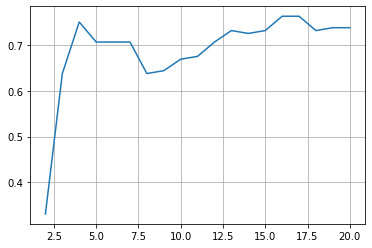

In [130]:
acc=[]
for i in range(2,21):
    model=DecisionTreeClassifier(max_leaf_nodes=i)
    model.fit(train_X,train_Y)
    prediction4=model.predict(test_X)
    acc.append(metrics.accuracy_score(prediction4,test_Y))
plt.plot(range(2,21), acc)
plt.grid()

In [131]:
model=DecisionTreeClassifier(max_leaf_nodes=4)
model.fit(train_X,train_Y)
prediction4=model.predict(test_X)
print('The accuracy of the Decision Tree is',metrics.accuracy_score(prediction4,test_Y))

The accuracy of the Decision Tree is 0.75


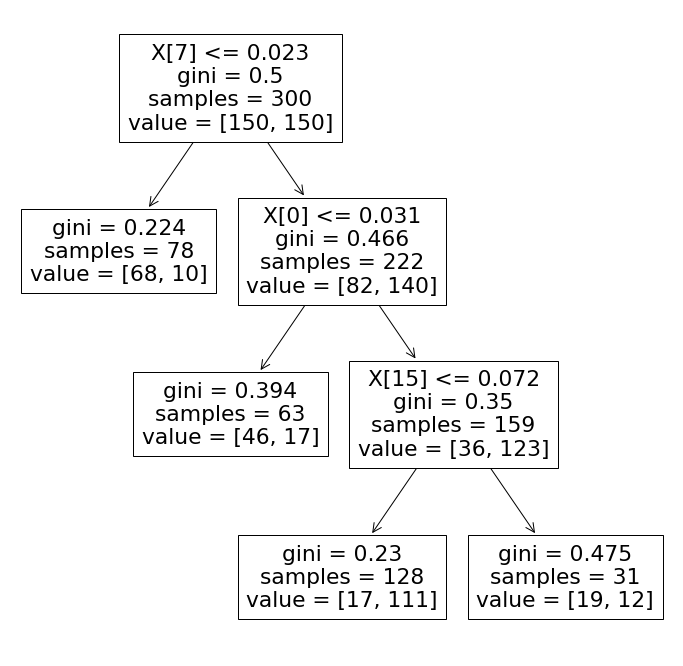

In [132]:
from sklearn import tree
fig, ax = plt.subplots(figsize=(12, 12))
_=tree.plot_tree(model)

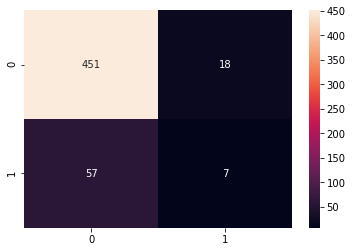

In [133]:
y_pred = cross_val_predict(DecisionTreeClassifier(max_leaf_nodes=4),X,Y,cv=10)
_=sns.heatmap(confusion_matrix(Y,y_pred),annot=True,fmt='2.0f')

In [134]:
kfold = KFold(n_splits=5, random_state=0) # k=10, split the data into 10 equal parts
xyz=[]
accuracy=[]
std=[]
classifiers=['Linear Svm','Radial Svm','Logistic Regression','KNN','Decision Tree','Naive Bayes','Random Forest']
models=[svm.SVC(kernel='linear'),svm.SVC(kernel='rbf'),LogisticRegression(),KNeighborsClassifier(n_neighbors=9),DecisionTreeClassifier(max_leaf_nodes=4),GaussianNB(),RandomForestClassifier(n_estimators=100)]
for i in models:
    model = i
    cv_result = cross_val_score(model,X,Y, cv = kfold, scoring = "accuracy")
    cv_result=cv_result
    xyz.append(cv_result.mean())
    std.append(cv_result.std())
    accuracy.append(cv_result)
new_models_dataframe2=pd.DataFrame({'CV Mean':xyz,'Std':std},index=classifiers)       
new_models_dataframe2

,CV Mean,Std
Linear Svm,0.879862,0.052828
Radial Svm,0.879862,0.052828
Logistic Regression,0.879862,0.052828
KNN,0.857327,0.044741
Decision Tree,0.825410,0.047949
Naive Bayes,0.765227,0.058305
Random Forest,0.887445,0.046922


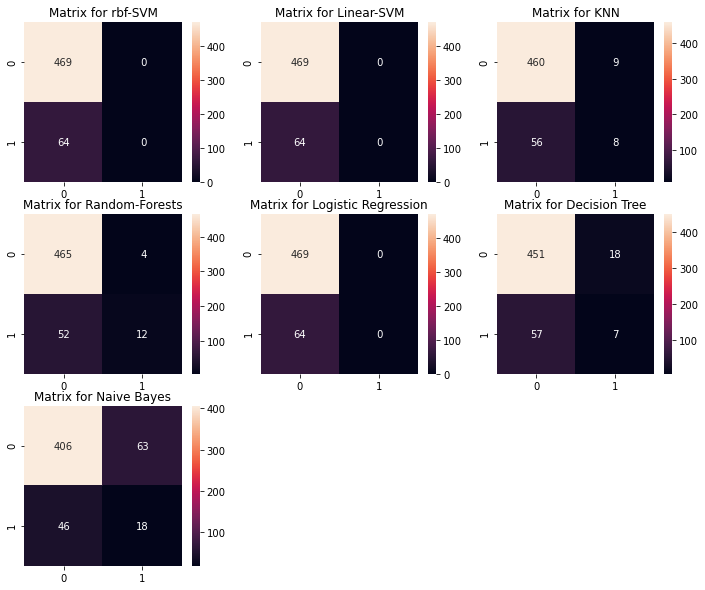

In [135]:
f,ax=plt.subplots(3,3,figsize=(12,10))
y_pred = cross_val_predict(svm.SVC(kernel='rbf'),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[0,0],annot=True,fmt='2.0f')
ax[0,0].set_title('Matrix for rbf-SVM')
y_pred = cross_val_predict(svm.SVC(kernel='linear'),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[0,1],annot=True,fmt='2.0f')
ax[0,1].set_title('Matrix for Linear-SVM')
y_pred = cross_val_predict(KNeighborsClassifier(n_neighbors=9),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[0,2],annot=True,fmt='2.0f')
ax[0,2].set_title('Matrix for KNN')
y_pred = cross_val_predict(RandomForestClassifier(n_estimators=100),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[1,0],annot=True,fmt='2.0f')
ax[1,0].set_title('Matrix for Random-Forests')
y_pred = cross_val_predict(LogisticRegression(),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[1,1],annot=True,fmt='2.0f')
ax[1,1].set_title('Matrix for Logistic Regression')
y_pred = cross_val_predict(DecisionTreeClassifier(max_leaf_nodes=4),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[1,2],annot=True,fmt='2.0f')
ax[1,2].set_title('Matrix for Decision Tree')
y_pred = cross_val_predict(GaussianNB(),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[2,0],annot=True,fmt='2.0f')
ax[2,0].set_title('Matrix for Naive Bayes')
plt.subplots_adjust(hspace=0.2,wspace=0.2)
f.delaxes(ax[2,1])
f.delaxes(ax[2,2])
plt.show()

## V.e Description type de sol (Remote vs Rural)

In [136]:
data_type_ru_re = data.copy()
data_type_ru_re = data_type_ru_re[data_type_ru_re['Type']!='Urban']

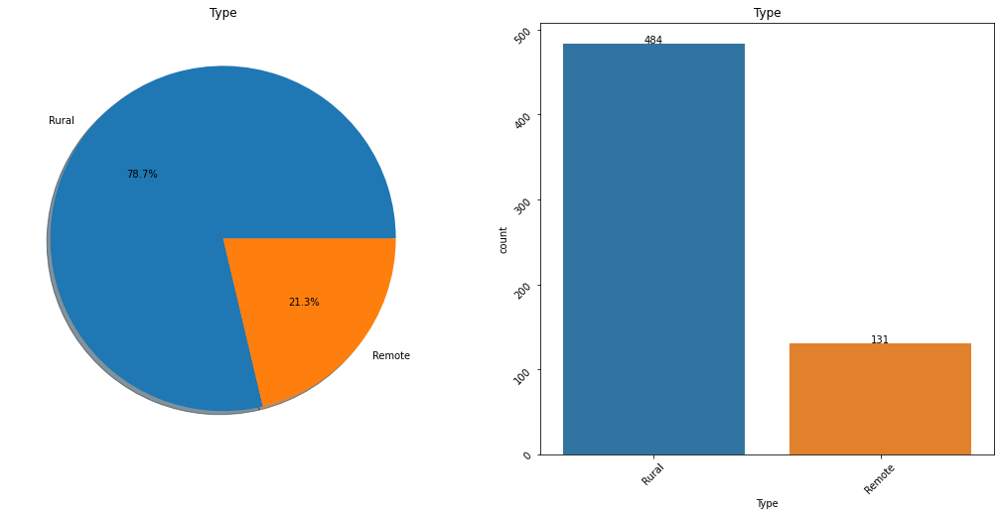

In [137]:
col = 'Type'
f,ax=plt.subplots(1,2,figsize=(18,8))
data_type_ru_re[col].value_counts().plot.pie(autopct='%1.1f%%',ax=ax[0],shadow=True)
ax[0].set_title(col)
ax[0].set_ylabel('')
graph1=sns.countplot(col,data=data_type_ru_re,ax=ax[1])
ax[1].set_title(col)
ax[1].tick_params(labelrotation=45)
for p in graph1.patches:
    height = p.get_height()
    graph1.text(p.get_x()+p.get_width()/2., height + 0.1, height,ha="center")
plt.show()

In [138]:
data_type_ru_re['label'] = data_type_ru_re['Type'].map({'Rural': 0, 'Urban': 1, 'Remote': 2})

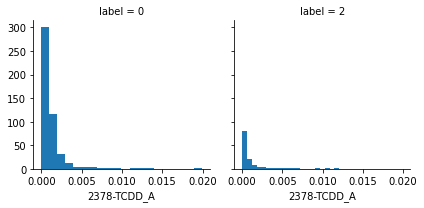

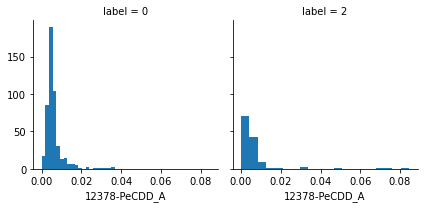

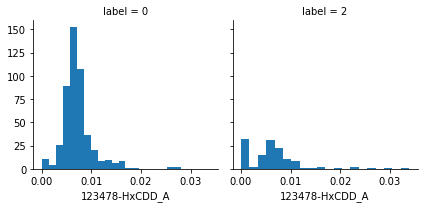

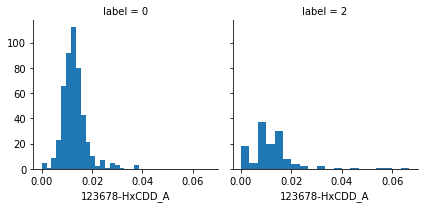

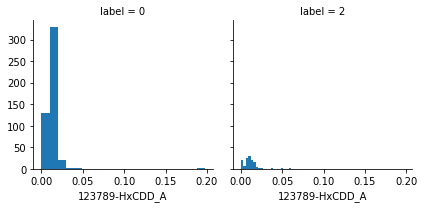

...

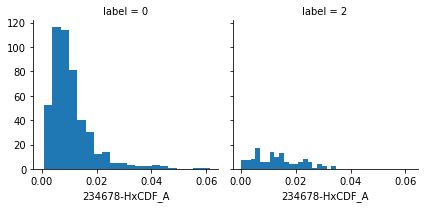

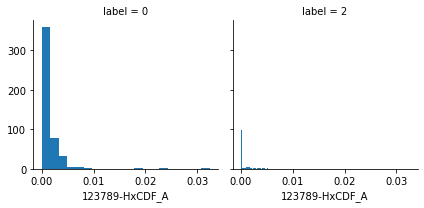

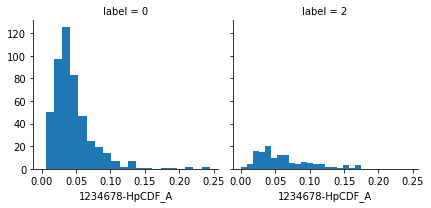

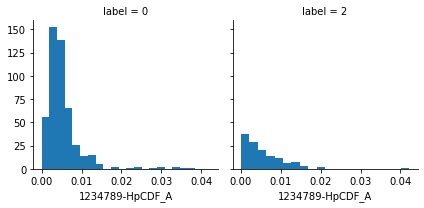

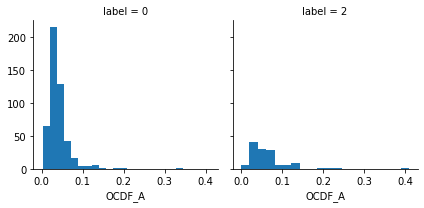

In [139]:
congenere = ['2378-TCDD_A', '12378-PeCDD_A', '123478-HxCDD_A', '123678-HxCDD_A',
       '123789-HxCDD_A', '1234678-HpCDD_A', 'OCDD_A', '2378-TCDF_A',
       '12378-PeCDF_A', '23478-PeCDF_A', '123478-HxCDF_A', '123678-HxCDF_A',
       '234678-HxCDF_A', '123789-HxCDF_A', '1234678-HpCDF_A',
       '1234789-HpCDF_A', 'OCDF_A']

for i in congenere:
    g = sns.FacetGrid(data_type_ru_re, col='label')
    _= g.map(plt.hist, i, bins=20)
    plt.show()

## V.f Classification type de sol (Remote vs Rural)

In [140]:
#importing all the required ML packages
from sklearn.linear_model import LogisticRegression #logistic regression
from sklearn import svm #support vector Machine
from sklearn.ensemble import RandomForestClassifier #Random Forest
from sklearn.neighbors import KNeighborsClassifier #KNN
from sklearn.naive_bayes import GaussianNB #Naive bayes
from sklearn.tree import DecisionTreeClassifier #Decision Tree
from sklearn.model_selection import train_test_split #training and testing data split
from sklearn import metrics #accuracy measure
from sklearn.metrics import confusion_matrix #for confusion matrix
from sklearn.model_selection import KFold #for K-fold cross validation
from sklearn.model_selection import cross_val_score #score evaluation
from sklearn.model_selection import cross_val_predict #prediction

### 1- Normalisation A

In [141]:
train,test=train_test_split(data_type_ru_re,test_size=0.3,random_state=0,stratify=data_type_ru_re['label'])
train_X=train[train.columns[5:22]]
train_Y=train[train.columns[-1:]]
test_X=test[test.columns[5:22]]
test_Y=test[test.columns[-1:]]
X=data_type_ru_re[data_type_ru_re.columns[5:22]]
Y=data_type_ru_re['label']

{'Rural': 0, 'Urban': 1, 'Remote': 2}


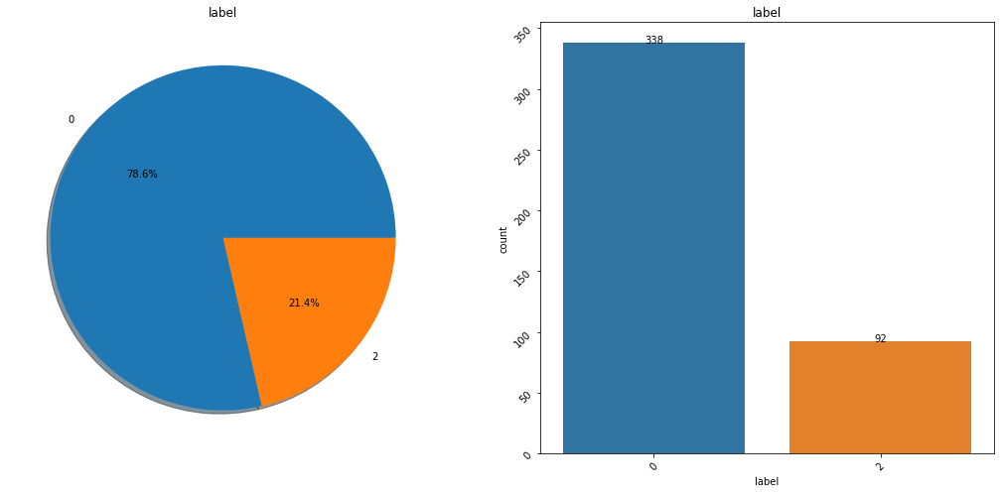

In [142]:
print({'Rural': 0, 'Urban': 1, 'Remote': 2})
col = 'label'
f,ax=plt.subplots(1,2,figsize=(18,8))
train_Y[col].value_counts().plot.pie(autopct='%1.1f%%',ax=ax[0],shadow=True)
ax[0].set_title(col)
ax[0].set_ylabel('')
graph1=sns.countplot(col,data=train_Y,ax=ax[1])
ax[1].set_title(col)
ax[1].tick_params(labelrotation=45)
for p in graph1.patches:
    height = p.get_height()
    graph1.text(p.get_x()+p.get_width()/2., height + 0.1, height,ha="center")
plt.show()

In [143]:
model = LogisticRegression()
model.fit(train_X,train_Y)
prediction3=model.predict(test_X)
print('The accuracy of the Logistic Regression is',metrics.accuracy_score(prediction3,test_Y))

The accuracy of the Logistic Regression is 0.7891891891891892


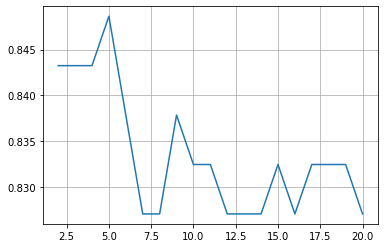

In [144]:
acc=[]
for i in range(2,21):
    model=DecisionTreeClassifier(max_leaf_nodes=i)
    model.fit(train_X,train_Y)
    prediction4=model.predict(test_X)
    acc.append(metrics.accuracy_score(prediction4,test_Y))
plt.plot(range(2,21), acc)
plt.grid()

In [145]:
model=DecisionTreeClassifier(max_leaf_nodes=3)
model.fit(train_X,train_Y)
prediction4=model.predict(test_X)
print('The accuracy of the Decision Tree is',metrics.accuracy_score(prediction4,test_Y))

The accuracy of the Decision Tree is 0.8432432432432433


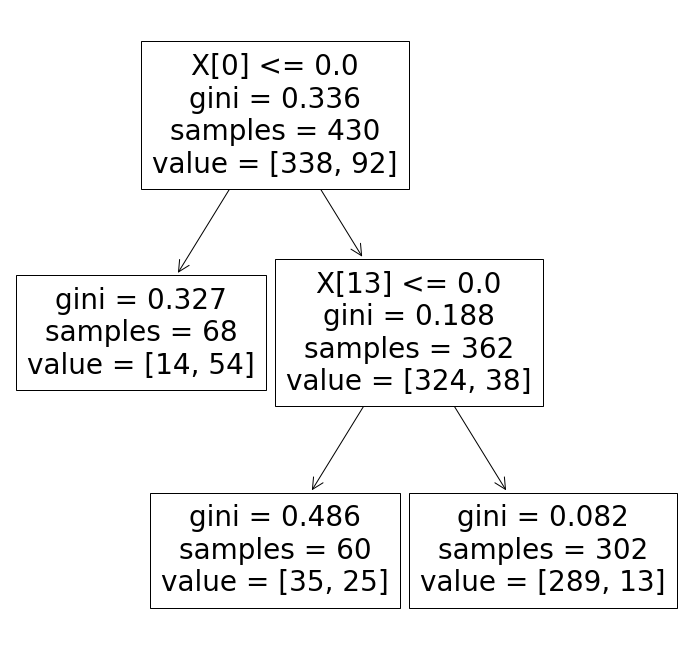

In [146]:
from sklearn import tree
fig, ax = plt.subplots(figsize=(12, 12))
_=tree.plot_tree(model)

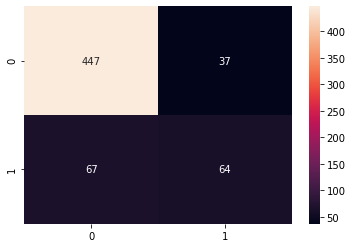

In [147]:
y_pred = cross_val_predict(DecisionTreeClassifier(max_leaf_nodes=3),X,Y,cv=10)
_=sns.heatmap(confusion_matrix(Y,y_pred),annot=True,fmt='2.0f')

In [148]:
kfold = KFold(n_splits=5, random_state=0) # k=10, split the data into 10 equal parts
xyz=[]
accuracy=[]
std=[]
classifiers=['Linear Svm','Radial Svm','Logistic Regression','KNN','Decision Tree','Naive Bayes','Random Forest']
models=[svm.SVC(kernel='linear'),svm.SVC(kernel='rbf'),LogisticRegression(),KNeighborsClassifier(n_neighbors=9),DecisionTreeClassifier(max_leaf_nodes=3),GaussianNB(),RandomForestClassifier(n_estimators=100)]
for i in models:
    model = i
    cv_result = cross_val_score(model,X,Y, cv = kfold, scoring = "accuracy")
    cv_result=cv_result
    xyz.append(cv_result.mean())
    std.append(cv_result.std())
    accuracy.append(cv_result)
new_models_dataframe2=pd.DataFrame({'CV Mean':xyz,'Std':std},index=classifiers)       
new_models_dataframe2

,CV Mean,Std
Linear Svm,0.786992,0.132538
Radial Svm,0.786992,0.132538
Logistic Regression,0.786992,0.132538
KNN,0.783740,0.119995
Decision Tree,0.817886,0.075675
Naive Bayes,0.783740,0.144395
Random Forest,0.843902,0.088525


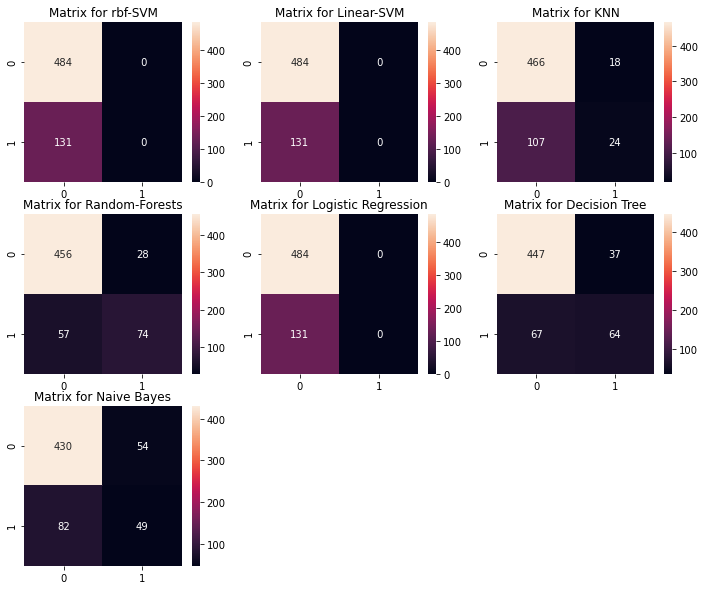

In [149]:
f,ax=plt.subplots(3,3,figsize=(12,10))
y_pred = cross_val_predict(svm.SVC(kernel='rbf'),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[0,0],annot=True,fmt='2.0f')
ax[0,0].set_title('Matrix for rbf-SVM')
y_pred = cross_val_predict(svm.SVC(kernel='linear'),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[0,1],annot=True,fmt='2.0f')
ax[0,1].set_title('Matrix for Linear-SVM')
y_pred = cross_val_predict(KNeighborsClassifier(n_neighbors=9),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[0,2],annot=True,fmt='2.0f')
ax[0,2].set_title('Matrix for KNN')
y_pred = cross_val_predict(RandomForestClassifier(n_estimators=100),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[1,0],annot=True,fmt='2.0f')
ax[1,0].set_title('Matrix for Random-Forests')
y_pred = cross_val_predict(LogisticRegression(),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[1,1],annot=True,fmt='2.0f')
ax[1,1].set_title('Matrix for Logistic Regression')
y_pred = cross_val_predict(DecisionTreeClassifier(max_leaf_nodes=3),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[1,2],annot=True,fmt='2.0f')
ax[1,2].set_title('Matrix for Decision Tree')
y_pred = cross_val_predict(GaussianNB(),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[2,0],annot=True,fmt='2.0f')
ax[2,0].set_title('Matrix for Naive Bayes')
plt.subplots_adjust(hspace=0.2,wspace=0.2)
f.delaxes(ax[2,1])
f.delaxes(ax[2,2])
plt.show()

### 2- Normalisation A with oversampling

In [150]:
data_type_ru_re = data.copy()
data_type_ru_re = data_type_ru_re[data_type_ru_re['Type']!='Urban']
data_type_ru_re['label'] = data_type_ru_re['Type'].map({'Rural': 0, 'Urban': 1, 'Remote': 2})

In [151]:
train,test=train_test_split(data_type_ru_re,test_size=0.3,random_state=0,stratify=data_type_ru_re['label'])
train_X=train[train.columns[5:22]]
train_Y=train[train.columns[-1:]]
test_X=test[test.columns[5:22]]
test_Y=test[test.columns[-1:]]
X=data_type_ru_re[data_type_ru_re.columns[5:22]]
Y=data_type_ru_re['label']

In [152]:
df = pd.concat([train_X,train_Y],axis=1)
df1 = df[df['label']==2]
df0 = df[df['label']==0]
df01 = df0.sample(150).reset_index(drop=True)
undersampled_df = pd.concat([df01,df1],axis=0).reset_index(drop=True)
train_X = undersampled_df[undersampled_df.columns[:17]]
train_Y = undersampled_df[undersampled_df.columns[-1:]]

In [153]:
from imblearn.over_sampling import SMOTE
sm = SMOTE(random_state=27, sampling_strategy={2:150})
train_X, train_Y = sm.fit_sample(train_X, train_Y)

{'Rural': 0, 'Urban': 1, 'Remote': 2}


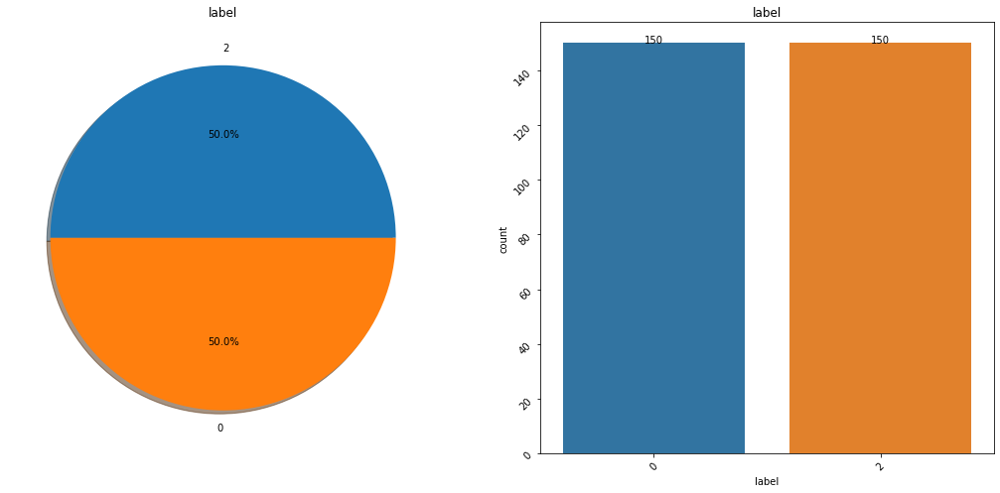

In [154]:
print({'Rural': 0, 'Urban': 1, 'Remote': 2})
col = 'label'
f,ax=plt.subplots(1,2,figsize=(18,8))
train_Y[col].value_counts().plot.pie(autopct='%1.1f%%',ax=ax[0],shadow=True)
ax[0].set_title(col)
ax[0].set_ylabel('')
graph1=sns.countplot(col,data=train_Y,ax=ax[1])
ax[1].set_title(col)
ax[1].tick_params(labelrotation=45)
for p in graph1.patches:
    height = p.get_height()
    graph1.text(p.get_x()+p.get_width()/2., height + 0.1, height,ha="center")
plt.show()

In [155]:
model = LogisticRegression()
model.fit(train_X,train_Y)
prediction3=model.predict(test_X)
print('The accuracy of the Logistic Regression is',metrics.accuracy_score(prediction3,test_Y))

The accuracy of the Logistic Regression is 0.6918918918918919


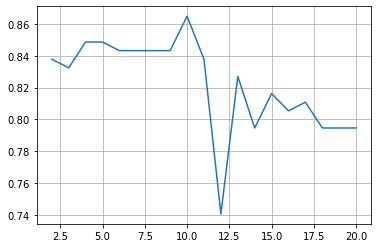

In [156]:
acc=[]
for i in range(2,21):
    model=DecisionTreeClassifier(max_leaf_nodes=i)
    model.fit(train_X,train_Y)
    prediction4=model.predict(test_X)
    acc.append(metrics.accuracy_score(prediction4,test_Y))
plt.plot(range(2,21), acc)
plt.grid()

In [157]:
model=DecisionTreeClassifier(max_leaf_nodes=5)
model.fit(train_X,train_Y)
prediction4=model.predict(test_X)
print('The accuracy of the Decision Tree is',metrics.accuracy_score(prediction4,test_Y))

The accuracy of the Decision Tree is 0.8486486486486486


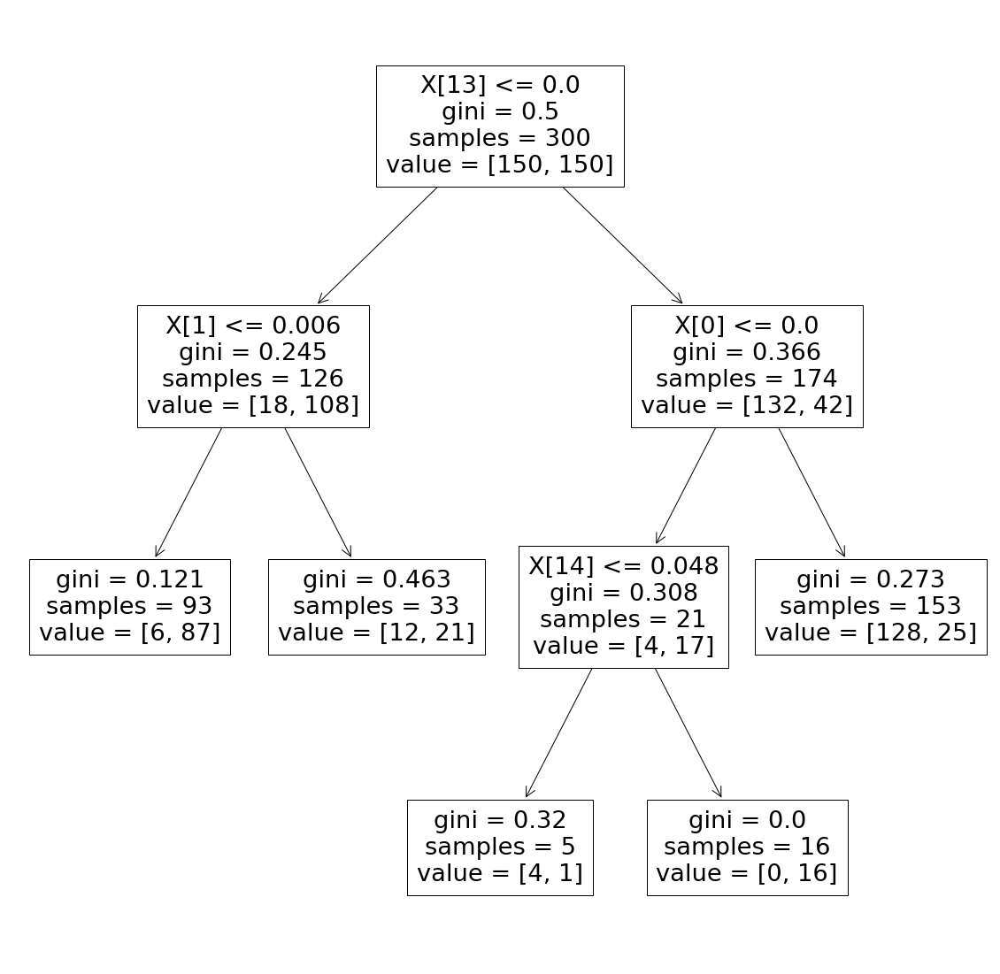

In [158]:
from sklearn import tree
fig, ax = plt.subplots(figsize=(20, 20))
_=tree.plot_tree(model)

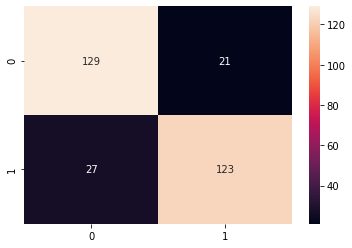

In [159]:
y_pred = cross_val_predict(DecisionTreeClassifier(max_leaf_nodes=4),train_X,train_Y,cv=10)
_=sns.heatmap(confusion_matrix(train_Y,y_pred),annot=True,fmt='2.0f')

In [160]:
kfold = KFold(n_splits=5, random_state=0) # k=10, split the data into 10 equal parts
xyz=[]
accuracy=[]
std=[]
classifiers=['Linear Svm','Radial Svm','Logistic Regression','KNN','Decision Tree','Naive Bayes','Random Forest']
models=[svm.SVC(kernel='linear'),svm.SVC(kernel='rbf'),LogisticRegression(),KNeighborsClassifier(n_neighbors=9),DecisionTreeClassifier(max_leaf_nodes=5),GaussianNB(),RandomForestClassifier(n_estimators=100)]
for i in models:
    model = i
    cv_result = cross_val_score(model,train_X,train_Y, cv = kfold, scoring = "accuracy")
    cv_result=cv_result
    xyz.append(cv_result.mean())
    std.append(cv_result.std())
    accuracy.append(cv_result)
new_models_dataframe2=pd.DataFrame({'CV Mean':xyz,'Std':std},index=classifiers)       
new_models_dataframe2

,CV Mean,Std
Linear Svm,0.120000,0.240000
Radial Svm,0.130000,0.260000
Logistic Regression,0.133333,0.266667
KNN,0.566667,0.077460
Decision Tree,0.706667,0.084063
Naive Bayes,0.536667,0.209338
Random Forest,0.793333,0.050111


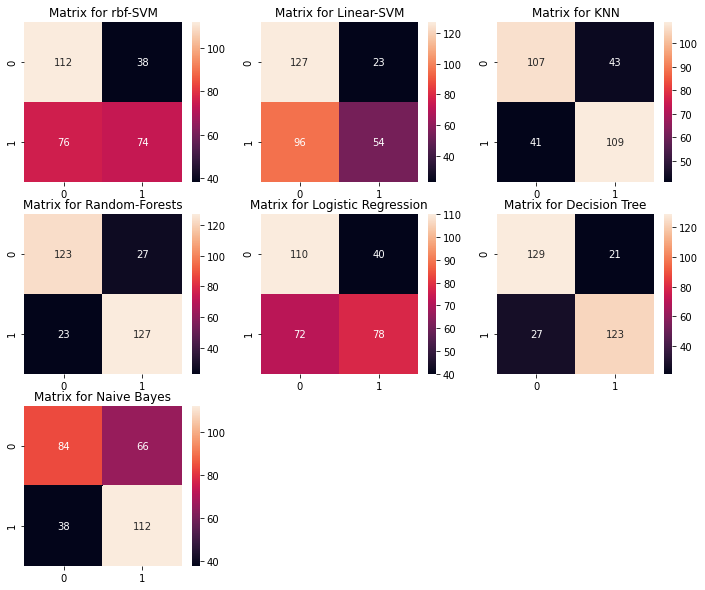

In [161]:
f,ax=plt.subplots(3,3,figsize=(12,10))
y_pred = cross_val_predict(svm.SVC(kernel='rbf'),train_X,train_Y,cv=10)
sns.heatmap(confusion_matrix(train_Y,y_pred),ax=ax[0,0],annot=True,fmt='2.0f')
ax[0,0].set_title('Matrix for rbf-SVM')
y_pred = cross_val_predict(svm.SVC(kernel='linear'),train_X,train_Y,cv=10)
sns.heatmap(confusion_matrix(train_Y,y_pred),ax=ax[0,1],annot=True,fmt='2.0f')
ax[0,1].set_title('Matrix for Linear-SVM')
y_pred = cross_val_predict(KNeighborsClassifier(n_neighbors=9),train_X,train_Y,cv=10)
sns.heatmap(confusion_matrix(train_Y,y_pred),ax=ax[0,2],annot=True,fmt='2.0f')
ax[0,2].set_title('Matrix for KNN')
y_pred = cross_val_predict(RandomForestClassifier(n_estimators=100),train_X,train_Y,cv=10)
sns.heatmap(confusion_matrix(train_Y,y_pred),ax=ax[1,0],annot=True,fmt='2.0f')
ax[1,0].set_title('Matrix for Random-Forests')
y_pred = cross_val_predict(LogisticRegression(),train_X,train_Y,cv=10)
sns.heatmap(confusion_matrix(train_Y,y_pred),ax=ax[1,1],annot=True,fmt='2.0f')
ax[1,1].set_title('Matrix for Logistic Regression')
y_pred = cross_val_predict(DecisionTreeClassifier(max_leaf_nodes=4),train_X,train_Y,cv=10)
sns.heatmap(confusion_matrix(train_Y,y_pred),ax=ax[1,2],annot=True,fmt='2.0f')
ax[1,2].set_title('Matrix for Decision Tree')
y_pred = cross_val_predict(GaussianNB(),train_X,train_Y,cv=10)
sns.heatmap(confusion_matrix(train_Y,y_pred),ax=ax[2,0],annot=True,fmt='2.0f')
ax[2,0].set_title('Matrix for Naive Bayes')
plt.subplots_adjust(hspace=0.2,wspace=0.2)
f.delaxes(ax[2,1])
f.delaxes(ax[2,2])
plt.show()

### 3- Normalisation C:

In [162]:
data_type_ru_re_C = data_type_ru_re[data_type_ru_re.columns[22:40]].copy()
data_type_ru_re_C.dropna(inplace=True)
data_type_ru_re_C.reset_index(drop=True, inplace=True)

In [163]:
train,test=train_test_split(data_type_ru_re_C,test_size=0.3,random_state=0,stratify=data_type_ru_re_C['label'])
train_X=train[train.columns[:17]]
train_Y=train[train.columns[-1:]]
test_X=test[test.columns[:17]]
test_Y=test[test.columns[-1:]]
X=data_type_ru_re_C[data_type_ru_re_C.columns[:17]]
Y=data_type_ru_re_C['label']

{'Rural': 0, 'Urban': 1, 'Remote': 2}


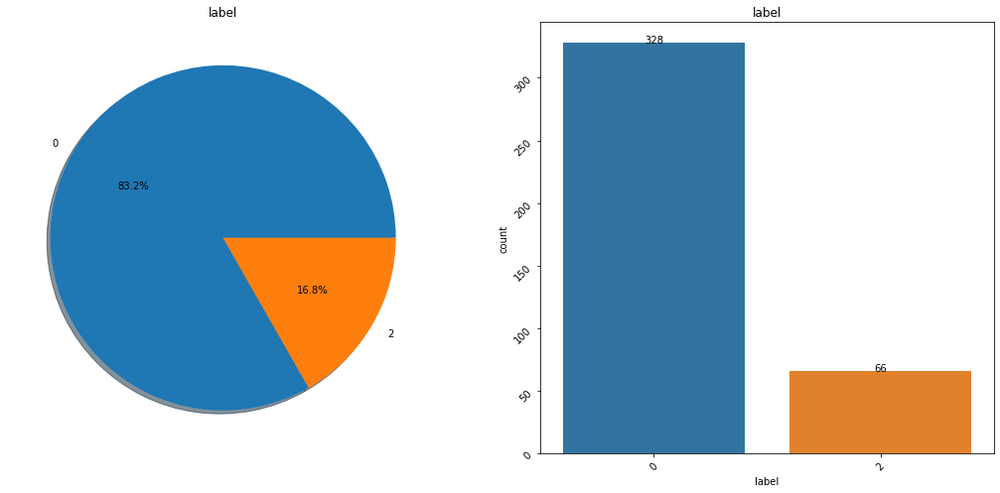

In [164]:
print({'Rural': 0, 'Urban': 1, 'Remote': 2})
col = 'label'
f,ax=plt.subplots(1,2,figsize=(18,8))
train_Y[col].value_counts().plot.pie(autopct='%1.1f%%',ax=ax[0],shadow=True)
ax[0].set_title(col)
ax[0].set_ylabel('')
graph1=sns.countplot(col,data=train_Y,ax=ax[1])
ax[1].set_title(col)
ax[1].tick_params(labelrotation=45)
for p in graph1.patches:
    height = p.get_height()
    graph1.text(p.get_x()+p.get_width()/2., height + 0.1, height,ha="center")
plt.show()

In [165]:
model = LogisticRegression()
model.fit(train_X,train_Y)
prediction3=model.predict(test_X)
print('The accuracy of the Logistic Regression is',metrics.accuracy_score(prediction3,test_Y))

The accuracy of the Logistic Regression is 0.8352941176470589


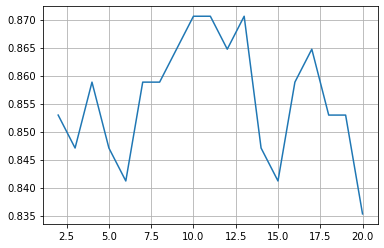

In [166]:
acc=[]
for i in range(2,21):
    model=DecisionTreeClassifier(max_leaf_nodes=i)
    model.fit(train_X,train_Y)
    prediction4=model.predict(test_X)
    acc.append(metrics.accuracy_score(prediction4,test_Y))
plt.plot(range(2,21), acc)
plt.grid()

In [167]:
model=DecisionTreeClassifier(max_leaf_nodes=8)
model.fit(train_X,train_Y)
prediction4=model.predict(test_X)
print('The accuracy of the Decision Tree is',metrics.accuracy_score(prediction4,test_Y))

The accuracy of the Decision Tree is 0.8588235294117647


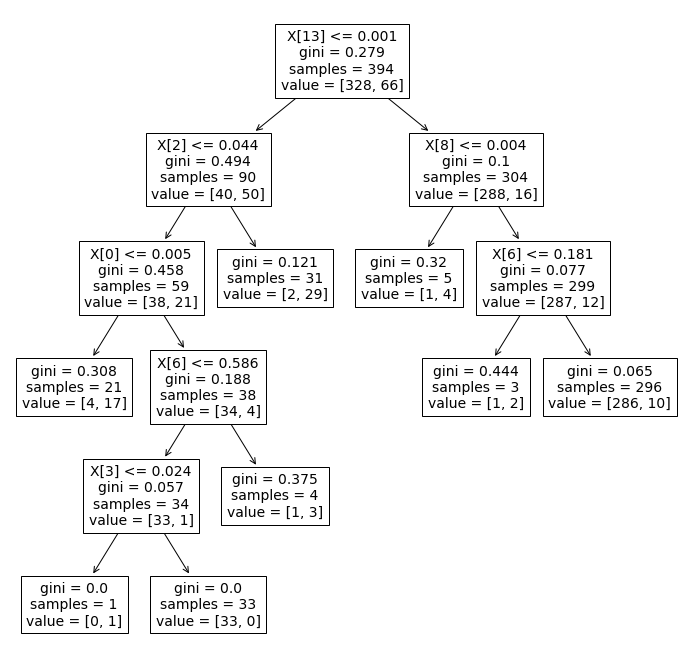

In [168]:
from sklearn import tree
fig, ax = plt.subplots(figsize=(12, 12))
_=tree.plot_tree(model)

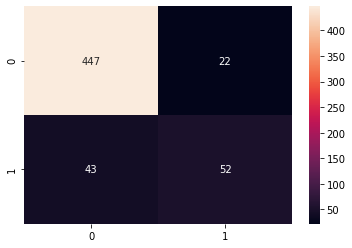

In [169]:
y_pred = cross_val_predict(DecisionTreeClassifier(max_leaf_nodes=8),X,Y,cv=10)
_=sns.heatmap(confusion_matrix(Y,y_pred),annot=True,fmt='2.0f')

In [170]:
kfold = KFold(n_splits=5, random_state=0) # k=10, split the data into 10 equal parts
xyz=[]
accuracy=[]
std=[]
classifiers=['Linear Svm','Radial Svm','Logistic Regression','KNN','Decision Tree','Naive Bayes','Random Forest']
models=[svm.SVC(kernel='linear'),svm.SVC(kernel='rbf'),LogisticRegression(),KNeighborsClassifier(n_neighbors=9),DecisionTreeClassifier(max_leaf_nodes=8),GaussianNB(),RandomForestClassifier(n_estimators=100)]
for i in models:
    model = i
    cv_result = cross_val_score(model,X,Y, cv = kfold, scoring = "accuracy")
    cv_result=cv_result
    xyz.append(cv_result.mean())
    std.append(cv_result.std())
    accuracy.append(cv_result)
new_models_dataframe2=pd.DataFrame({'CV Mean':xyz,'Std':std},index=classifiers)       
new_models_dataframe2

,CV Mean,Std
Linear Svm,0.831258,0.112566
Radial Svm,0.822408,0.108983
Logistic Regression,0.831258,0.112566
KNN,0.833186,0.080278
Decision Tree,0.847314,0.083178
Naive Bayes,0.799368,0.090744
Random Forest,0.852623,0.084922


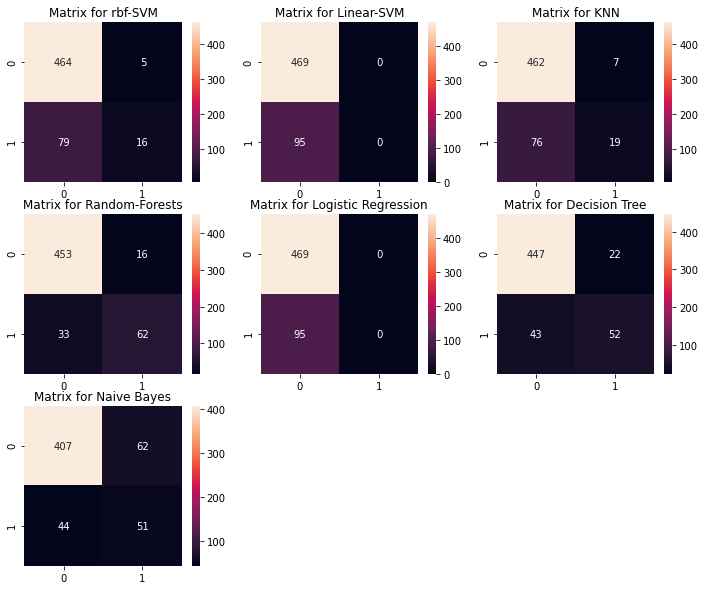

In [171]:
f,ax=plt.subplots(3,3,figsize=(12,10))
y_pred = cross_val_predict(svm.SVC(kernel='rbf'),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[0,0],annot=True,fmt='2.0f')
ax[0,0].set_title('Matrix for rbf-SVM')
y_pred = cross_val_predict(svm.SVC(kernel='linear'),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[0,1],annot=True,fmt='2.0f')
ax[0,1].set_title('Matrix for Linear-SVM')
y_pred = cross_val_predict(KNeighborsClassifier(n_neighbors=9),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[0,2],annot=True,fmt='2.0f')
ax[0,2].set_title('Matrix for KNN')
y_pred = cross_val_predict(RandomForestClassifier(n_estimators=100),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[1,0],annot=True,fmt='2.0f')
ax[1,0].set_title('Matrix for Random-Forests')
y_pred = cross_val_predict(LogisticRegression(),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[1,1],annot=True,fmt='2.0f')
ax[1,1].set_title('Matrix for Logistic Regression')
y_pred = cross_val_predict(DecisionTreeClassifier(max_leaf_nodes=8),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[1,2],annot=True,fmt='2.0f')
ax[1,2].set_title('Matrix for Decision Tree')
y_pred = cross_val_predict(GaussianNB(),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[2,0],annot=True,fmt='2.0f')
ax[2,0].set_title('Matrix for Naive Bayes')
plt.subplots_adjust(hspace=0.2,wspace=0.2)
f.delaxes(ax[2,1])
f.delaxes(ax[2,2])
plt.show()

### 4- Normalisation C with oversampling

In [172]:
data_type_ru_re = data.copy()
data_type_ru_re = data_type_ru_re[data_type_ru_re['Type']!='Urban']
data_type_ru_re['label'] = data_type_ru_re['Type'].map({'Rural': 0, 'Urban': 1, 'Remote': 2})

In [173]:
data_type_ru_re_C = data_type_ru_re[data_type_ru_re.columns[22:40]].copy()
data_type_ru_re_C.dropna(inplace=True)
data_type_ru_re_C.reset_index(drop=True, inplace=True)

In [174]:
train,test=train_test_split(data_type_ru_re_C,test_size=0.3,random_state=0,stratify=data_type_ru_re_C['label'])
train_X=train[train.columns[:17]]
train_Y=train[train.columns[-1:]]
test_X=test[test.columns[:17]]
test_Y=test[test.columns[-1:]]
X=data_type_ru_re_C[data_type_ru_re_C.columns[:17]]
Y=data_type_ru_re_C['label']

In [175]:
df = pd.concat([train_X,train_Y],axis=1)
df1 = df[df['label']==2]
df0 = df[df['label']==0]
df01 = df0.sample(150).reset_index(drop=True)
undersampled_df = pd.concat([df01,df1],axis=0).reset_index(drop=True)
train_X = undersampled_df[undersampled_df.columns[:17]]
train_Y = undersampled_df[undersampled_df.columns[-1:]]

In [176]:
from imblearn.over_sampling import SMOTE
sm = SMOTE(random_state=27, sampling_strategy={2:150})
train_X, train_Y = sm.fit_sample(train_X, train_Y)

{'Rural': 0, 'Urban': 1, 'Remote': 2}


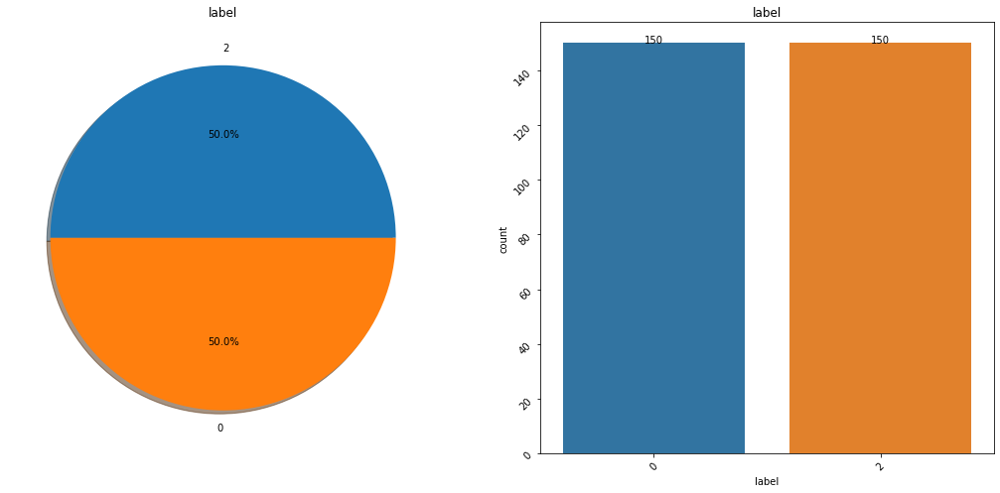

In [177]:
print({'Rural': 0, 'Urban': 1, 'Remote': 2})
col = 'label'
f,ax=plt.subplots(1,2,figsize=(18,8))
train_Y[col].value_counts().plot.pie(autopct='%1.1f%%',ax=ax[0],shadow=True)
ax[0].set_title(col)
ax[0].set_ylabel('')
graph1=sns.countplot(col,data=train_Y,ax=ax[1])
ax[1].set_title(col)
ax[1].tick_params(labelrotation=45)
for p in graph1.patches:
    height = p.get_height()
    graph1.text(p.get_x()+p.get_width()/2., height + 0.1, height,ha="center")
plt.show()

In [178]:
model = LogisticRegression()
model.fit(train_X,train_Y)
prediction3=model.predict(test_X)
print('The accuracy of the Logistic Regression is',metrics.accuracy_score(prediction3,test_Y))

The accuracy of the Logistic Regression is 0.7470588235294118


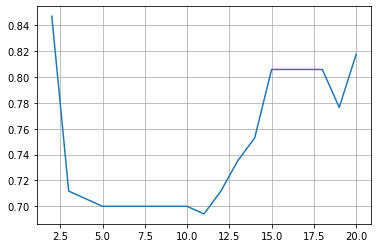

In [179]:
acc=[]
for i in range(2,21):
    model=DecisionTreeClassifier(max_leaf_nodes=i)
    model.fit(train_X,train_Y)
    prediction4=model.predict(test_X)
    acc.append(metrics.accuracy_score(prediction4,test_Y))
plt.plot(range(2,21), acc)
plt.grid()

In [180]:
model=DecisionTreeClassifier(max_leaf_nodes=4)
model.fit(train_X,train_Y)
prediction4=model.predict(test_X)
print('The accuracy of the Decision Tree is',metrics.accuracy_score(prediction4,test_Y))

The accuracy of the Decision Tree is 0.7058823529411765


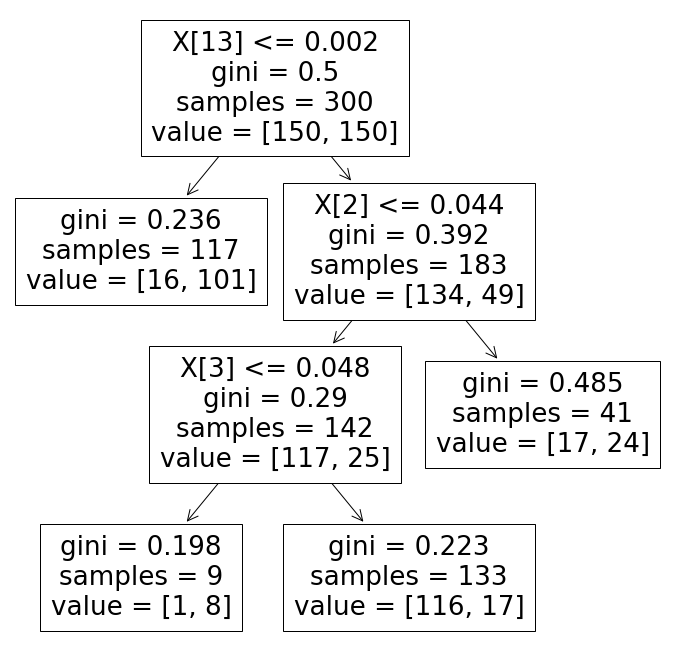

In [181]:
from sklearn import tree
fig, ax = plt.subplots(figsize=(12, 12))
_=tree.plot_tree(model)

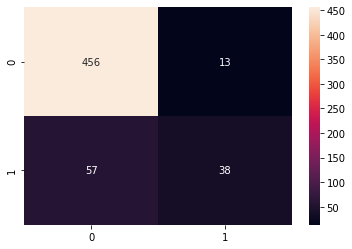

In [182]:
y_pred = cross_val_predict(DecisionTreeClassifier(max_leaf_nodes=4),X,Y,cv=10)
_=sns.heatmap(confusion_matrix(Y,y_pred),annot=True,fmt='2.0f')

In [183]:
kfold = KFold(n_splits=5, random_state=0) # k=10, split the data into 10 equal parts
xyz=[]
accuracy=[]
std=[]
classifiers=['Linear Svm','Radial Svm','Logistic Regression','KNN','Decision Tree','Naive Bayes','Random Forest']
models=[svm.SVC(kernel='linear'),svm.SVC(kernel='rbf'),LogisticRegression(),KNeighborsClassifier(n_neighbors=9),DecisionTreeClassifier(max_leaf_nodes=4),GaussianNB(),RandomForestClassifier(n_estimators=100)]
for i in models:
    model = i
    cv_result = cross_val_score(model,X,Y, cv = kfold, scoring = "accuracy")
    cv_result=cv_result
    xyz.append(cv_result.mean())
    std.append(cv_result.std())
    accuracy.append(cv_result)
new_models_dataframe2=pd.DataFrame({'CV Mean':xyz,'Std':std},index=classifiers)       
new_models_dataframe2

,CV Mean,Std
Linear Svm,0.831258,0.112566
Radial Svm,0.822408,0.108983
Logistic Regression,0.831258,0.112566
KNN,0.833186,0.080278
Decision Tree,0.852639,0.095286
Naive Bayes,0.799368,0.090744
Random Forest,0.841972,0.085524


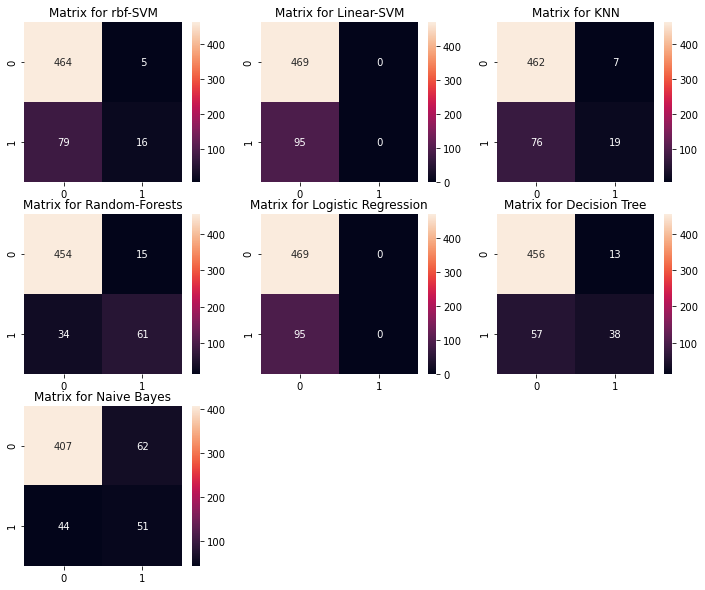

In [184]:
f,ax=plt.subplots(3,3,figsize=(12,10))
y_pred = cross_val_predict(svm.SVC(kernel='rbf'),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[0,0],annot=True,fmt='2.0f')
ax[0,0].set_title('Matrix for rbf-SVM')
y_pred = cross_val_predict(svm.SVC(kernel='linear'),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[0,1],annot=True,fmt='2.0f')
ax[0,1].set_title('Matrix for Linear-SVM')
y_pred = cross_val_predict(KNeighborsClassifier(n_neighbors=9),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[0,2],annot=True,fmt='2.0f')
ax[0,2].set_title('Matrix for KNN')
y_pred = cross_val_predict(RandomForestClassifier(n_estimators=100),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[1,0],annot=True,fmt='2.0f')
ax[1,0].set_title('Matrix for Random-Forests')
y_pred = cross_val_predict(LogisticRegression(),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[1,1],annot=True,fmt='2.0f')
ax[1,1].set_title('Matrix for Logistic Regression')
y_pred = cross_val_predict(DecisionTreeClassifier(max_leaf_nodes=4),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[1,2],annot=True,fmt='2.0f')
ax[1,2].set_title('Matrix for Decision Tree')
y_pred = cross_val_predict(GaussianNB(),X,Y,cv=10)
sns.heatmap(confusion_matrix(Y,y_pred),ax=ax[2,0],annot=True,fmt='2.0f')
ax[2,0].set_title('Matrix for Naive Bayes')
plt.subplots_adjust(hspace=0.2,wspace=0.2)
f.delaxes(ax[2,1])
f.delaxes(ax[2,2])
plt.show()